**Projet 4: Construisez un modèle de scoring** 

**Modélisation**

Dans ce notebook, nous allons utiliser les fichiers créés dans l'analyse exploratoire, afin de prédire la probabilité d'un client de rembourser ou non le crédit qu'il demande et les classer en classe 1 (haut risque de ne pas rembourser le crédit) ou classe zero (crédit accordé, pas de risque).

Pour ce faire, nous allons:
> - **définir une fonction de coût métier**, pour modéliser le coût pour la banque en cas d'erreur,
> - **rechercher un seuil**, au delà duquel la probabilité est traduite comme une classe positive. Ce seuil sera défini pour minimiser autant que possible le coût métier
> - **appliquer des méthodes de rééquilibrage des classes**, les cas positifs étant sous-représentés
> - **tester 6 modèles différents**, du plus simple au plus complexe, afin de trouvé le modèle qui prédit au mieux les défauts de paiement
> - **rechercher les hyperparamètres** qui optimisent la performance de chacun des modèles
> - **développer un module d'explication de la prédiction**, qui servira aux chargés de clientèle de comprendre pourquoi le modèle accepte ou refuse la demande de crédit d'un client, et quels sont les critères qui ont impacté le plus la décision.

> "View" > "Table of contents" pour voir le plan du notebook

# 1. Imports et paramétrages

## 1.1 Import des librairies

In [1]:
!pip install statsmodels mlflow tensorflow prophet lightgbm shap lime


[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
!pip install matplotlib numpy pandas scikit-learn scipy torch tqdm einops


[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# Data
import pandas as pd
import numpy as np
import random

import seaborn as sns
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning

import mlflow
import mlflow.sklearn

from tensorflow import keras
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense


# ETSformer
import argparse
import torch
import random
import numpy as np
import os
import sys


from exp.exp_main import Exp_Main

import shap
from lime import lime_tabular


In [4]:
import matplotlib
matplotlib.use('module://matplotlib_inline.backend_inline')

import matplotlib.pyplot as plt
%matplotlib inline


## 1.2 Paramétrages

In [5]:
#parametrage de panda pour afficher toutes les colonnes sans les tronquer
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


# # Désactiver les warnings
# warnings.simplefilter("ignore", ConvergenceWarning)

## 1.3 Data

In [6]:
# Chargement des DataFrames travaillés dans le premier notebook, à partir des fichiers .pkl
df_simple = pd.read_pickle("df_simple.pkl")
df_feats = pd.read_pickle("df_features.pkl")
df_exo = pd.read_pickle("df_exo.pkl")

In [7]:
df_feats.head()

,Store,Sales,Open,Promo,Promo2,Promo2Active,SchoolHoliday,CompetitionDistance,CompetitionActive,StateHoliday_a,StateHoliday_b,StateHoliday_c,StoreType_b,StoreType_c,StoreType_d,Assortment_b,Assortment_c,"PromoInterval_Jan,Apr,Jul,Oct","PromoInterval_Mar,Jun,Sept,Dec",PromoInterval_No_Promo2,DayOfWeek_sin,DayOfWeek_cos,Month_sin,Month_cos
Date,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1115,-1.835814,0,0,1,0,1,0.0,0,1,0,0,0,0,1,0,1,0,1,0,0.974928,-0.222521,0.5,0.866025
2013-01-01,379,-1.886980,0,0,0,0,1,0.0,0,1,0,0,0,0,1,0,0,0,0,1,0.974928,-0.222521,0.5,0.866025
2013-01-01,378,-1.799942,0,0,0,0,1,0.0,0,1,0,0,0,0,0,0,1,0,0,1,0.974928,-0.222521,0.5,0.866025
2013-01-01,377,-1.850097,0,0,1,0,1,0.0,0,1,0,0,0,0,0,0,1,0,0,0,0.974928,-0.222521,0.5,0.866025
2013-01-01,376,-1.795761,0,0,0,0,1,0.0,0,1,0,0,0,0,0,0,0,0,0,1,0.974928,-0.222521,0.5,0.866025


## 1.4 Fonctions

### 1.4.1 Mesure perf

In [8]:
def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

def rmspe(y_true, y_pred):
    # On évite la division par zéro
    mask = y_true != 0
    return np.sqrt(np.mean(((y_true[mask] - y_pred[mask]) / y_true[mask]) ** 2))

def mae(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred))

### 1.4.2 Split de l'ensemble en train/test

In [9]:
def prepare_train_test_by_store(df, split_date, selected_stores):
    """
    Sélectionne les magasins déjà donnés par l'utilisateur,
    et sépare les données en train (env 2013-2014) et test (2015) par magasin à une date "split_date" donnée.

    Args:
        df (pd.DataFrame): Données complètes avec une colonne 'Store' et 'date'.
        n_stores (int): Nombre de magasins à sélectionner.
        random_state (int): Pour rendre la sélection reproductible.

    Returns:
        df_train (pd.DataFrame), df_test (pd.DataFrame): Données splittées.
    """
    # Conversion en datetime si besoin
    if not np.issubdtype(df['date'].dtype, np.datetime64):
        df['date'] = pd.to_datetime(df['date'])

    # # Sélection aléatoire de magasins
    # unique_stores = df['Store'].unique()
    # np.random.seed(random_state)
    # selected_stores = np.random.choice(unique_stores, size=n_stores, replace=False)

    # Filtrer les données pour les magasins sélectionnés
    df_subset = df[df['Store'].isin(selected_stores)].copy()

    # Split temporel
    df_train = df_subset[df_subset['date'] < split_date]
    df_test = df_subset[df_subset['date'] >= split_date]

    print(f"Magasins sélectionnés: {sorted(selected_stores)}")
    print(f"Taille train: {df_train.shape}, test: {df_test.shape}")
    
    return df_train, df_test

### 1.4.3 Visualisation

In [10]:
def plot_aggregated_forecast(df, store_ids, start_date, forecast_col='Sales_forecast'):
    """
    Affiche les ventes réelles vs prévisions (agrégées) pour une liste de magasins,
    avec un historique depuis start_date.
    """
    df_plot = df[df['Store'].isin(store_ids)].copy()
    df_plot['date'] = pd.to_datetime(df_plot['date'])
    start_date = pd.to_datetime(start_date)

    df_plot = df_plot[df_plot['date'] >= start_date]

    # Agréger par date
    df_agg = df_plot.groupby('date')[['Sales', forecast_col]].sum().reset_index()

    # Tracer
    plt.figure(figsize=(14, 6))
    plt.plot(df_agg['date'], df_agg['Sales'], label='Actuals (somme)', color='blue')
    plt.plot(df_agg['date'], df_agg[forecast_col], label='Prédictions (somme)', color='orange', linestyle='--')

    plt.title(f"Ventes réelles vs prévisions – Agrégées sur {len(store_ids)} magasins (depuis {start_date.date()})")
    plt.xlabel("Date")
    plt.ylabel("Ventes totales")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [11]:
def plot_forecasts(df, store_ids, start_date, forecast_col='Sales_forecast'):
    """
    Affiche les ventes réelles et prédites pour une sélection de magasins,
    avec un historique depuis start_date.
    """
    df_plot = df[df['Store'].isin(store_ids)].copy()
    df_plot['date'] = pd.to_datetime(df_plot['date'])
    start_date = pd.to_datetime(start_date)

    for store_id in store_ids:
        store_data = df_plot[df_plot['Store'] == store_id]
        store_data = store_data[store_data['date'] >= start_date]

        plt.figure(figsize=(14, 5))
        plt.plot(store_data['date'], store_data['Sales'], label='Actuals')
        plt.plot(store_data['date'], store_data[forecast_col], label='Prédiction', linestyle='--')
        plt.title(f"Store {store_id} - Ventes vs. Prévision (à partir de {start_date.date()})")
        plt.xlabel("Date")
        plt.ylabel("Ventes")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# 2. Baseline

Nous allons commencer par le modèle le plus simple, un dummy classifier, qui servira de benchmark.
Le dummy classifier n'aura pas un résultat meilleur qu'une prédiction aléatoire. Comme nous sommes dans un cas de classification binaire, ce modèle a une chance sur 2 de faire la bonne prédiction.
Il permettra cependant de donner une "baseline" pour évaluer la performance de nos prochains modèles.

## 2.1 Baseline 1: Naive

In [12]:
# On définit le nom de l'experience MLflow
mlflow.set_experiment("time-series-forecasting")

<Experiment: artifact_location='file:///C:/Users/flore/Openclassrooms/Projet%209/mlruns/171433497857515275', creation_time=1744981172333, experiment_id='171433497857515275', last_update_time=1744981172333, lifecycle_stage='active', name='time-series-forecasting', tags={}>

In [13]:
def naive_forecast(df_train, df_test, split_date):
    """
    Baseline naïve : prédit la moyenne des ventes sur la dernière semaine de 2014 pour chaque magasin.

    Args:
        df_train (DataFrame): Données d'entraînement (jusqu'à 2015-01-31)
        df_test (DataFrame): Données de test (à partir de 2015-02-01)
        train_end (str): Date de fin du jeu d'entraînement (incluse)

    Returns:
        df_test (DataFrame): DataFrame de test avec colonne 'Sales_forecast' ajoutée
    """
    df_train = df_train.copy()
    df_test = df_test.copy()

    df_train['date'] = pd.to_datetime(df_train['date'])
    df_test['date'] = pd.to_datetime(df_test['date'])

    df_test['Sales_forecast'] = np.nan

    for store_id, group in df_train.groupby('Store'):
        # Extraire la dernière semaine de ventes
        last_week = group[(group['date'] < split_date) & 
                          (group['date'] >= (split_date - pd.Timedelta(days=7)))]

        if not last_week.empty:
            mean_sales = last_week['Sales'].mean()
            mask = df_test['Store'] == store_id
            df_test.loc[mask, 'Sales_forecast'] = mean_sales
        else:
            print(f"[!] Pas de données pour la dernière semaine du magasin {store_id}.")

    return df_test


In [14]:
# Params
n_total = 100  # top magasins à considérer
n_stores = 10  # nombre de magasins à tirer au hasard
random_state = 42

# Étape 1 : Compter les dates disponibles par magasin
store_counts = df_simple.groupby('Store')['date'].nunique()

# Étape 2 : Sélectionner les top n_total magasins avec le plus d'historique
top_stores = store_counts.sort_values(ascending=False).head(n_total).index.to_numpy()

# Étape 3 : Tirer aléatoirement n_stores parmi eux
np.random.seed(random_state)
selected_stores = np.random.choice(top_stores, size=n_stores, replace=False)

print("Magasins sélectionnés :", selected_stores)

# Afficher le store_counts associé aux selected_stores
selected_store_counts = store_counts[selected_stores]
print("\nNombre de dates disponibles pour les magasins sélectionnés :")
print(selected_store_counts)

Magasins sélectionnés : [ 102   71   85   49   50   57 1086  105   10 1115]

Nombre de dates disponibles pour les magasins sélectionnés :
Store
102     942
71      942
85      942
49      942
50      942
57      942
1086    942
105     942
10      942
1115    942
Name: date, dtype: int64


In [15]:
with mlflow.start_run(run_name="naive_forecast"):

    # 1. Préparation
    split_date = pd.to_datetime('2015-06-01')
    df_train, df_test = prepare_train_test_by_store(df_simple, split_date, selected_stores)
    
    # 2. Baseline naïve
    df_test_naive = naive_forecast(df_train, df_test, split_date)
    
    # 3. Forecasting
    y_true = df_test_naive['Sales']
    y_pred = df_test_naive['Sales_forecast']
    
    # 4. Calcul et log des métriques
    rmse_val = rmse(y_true, y_pred)
    rmspe_val = rmspe(y_true, y_pred)
    mae_val = mae(y_true, y_pred)

    # Affichage des métriques
    print("Évaluation baseline naïve:")
    print(f"RMSE  : {rmse_val:,.2f}")
    print(f"RMSPE : {rmspe_val:,.4f}")
    print(f"MAE   : {mae_val:,.2f}")

    # Log des métriques
    mlflow.log_metric("RMSE", rmse_val)
    mlflow.log_metric("RMSPE", rmspe_val)
    mlflow.log_metric("MAE", mae_val)
    
    # 5. Log du modèle (ici juste une fonction, donc on peut sauvegarder les prédictions)
    df_test_naive[['Store', 'date', 'Sales_forecast']].to_csv("prévisions/naive_predictions.csv", index=False)
    mlflow.log_artifact("naive_predictions.csv")
    
    # paramètres de l’expérience
    mlflow.log_param("model_type", "naive_mean_last_week")
    mlflow.log_param("n_stores", n_stores)
    mlflow.log_param("split_date", split_date.strftime("%Y-%m-%d"))

Magasins sélectionnés: [np.int64(10), np.int64(49), np.int64(50), np.int64(57), np.int64(71), np.int64(85), np.int64(102), np.int64(105), np.int64(1086), np.int64(1115)]
Taille train: (8810, 3), test: (610, 3)
Évaluation baseline naïve:
RMSE  : 3,238.71
RMSPE : 0.3389
MAE   : 2,577.59


In [16]:
# Params
n_stores = 3  # nombre de magasins à tirer au hasard
random_state = 42

# Étape 3 : Tirer aléatoirement n_stores parmi eux
np.random.seed(random_state)
small_selected_stores = np.random.choice(selected_stores, size=n_stores, replace=False)

print("Magasins sélectionnés :", small_selected_stores)

Magasins sélectionnés : [10 71 57]


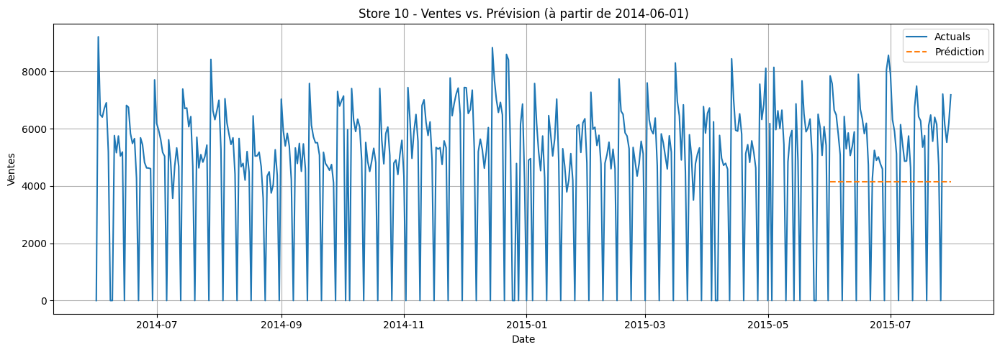

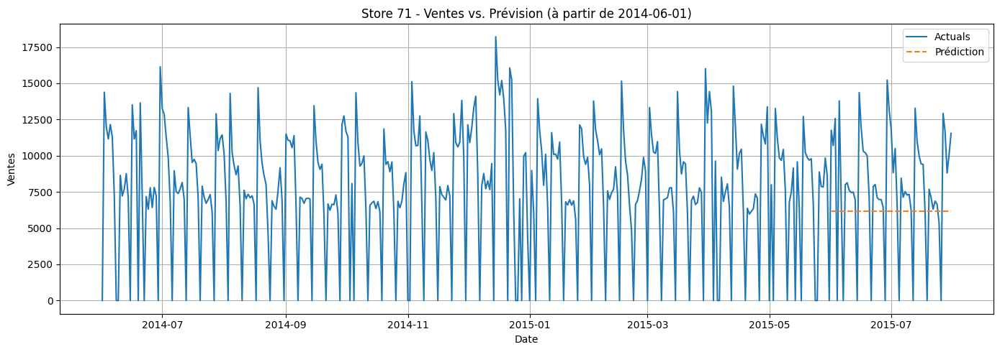

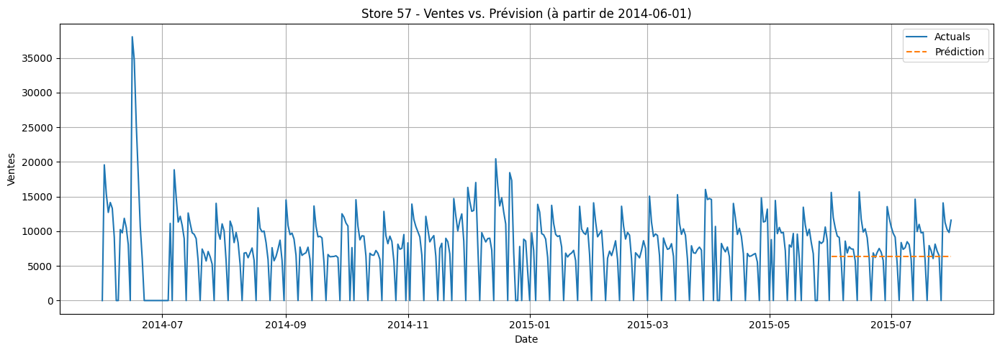

In [17]:
df_combined = pd.concat([df_train, df_test_naive])
plot_forecasts(df_combined, store_ids=small_selected_stores, start_date='2014-06-01', forecast_col='Sales_forecast')

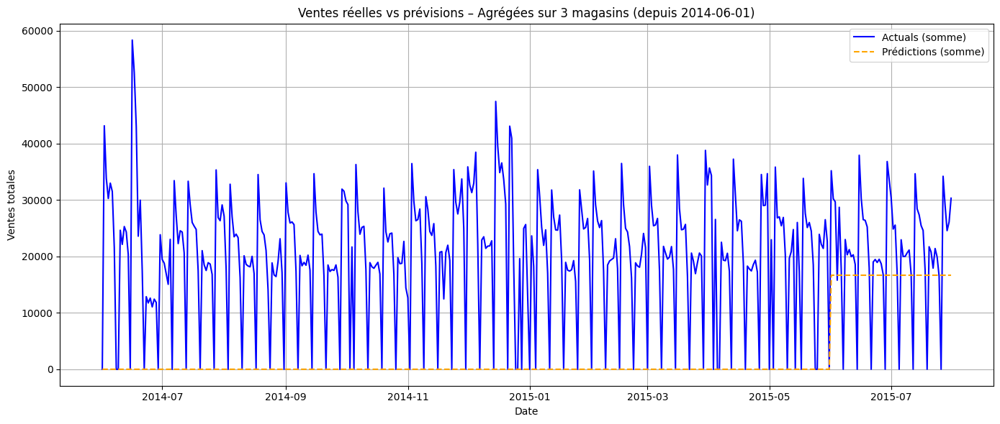

In [18]:
plot_aggregated_forecast(df_combined, store_ids=small_selected_stores, start_date='2014-06-01')

## 2.2 Baseline 2: Simple exponential smoothing

In [19]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

def simple_exponential_smoothing_forecast(df_train, df_test):
    """
    Applique Simple Exponential Smoothing pour chaque magasin.
    
    Args:
        df_train (pd.DataFrame): Doit contenir les colonnes 'Store', 'date', 'Sales'
        df_test (pd.DataFrame): Même structure que df_train

    Returns:
        df_test_ses (pd.DataFrame): Identique à df_test avec colonne 'Sales_pred_ses'
    """
    df_test = df_test.copy()
    df_test['date'] = pd.to_datetime(df_test['date'])
    df_train['date'] = pd.to_datetime(df_train['date'])

    df_test['Sales_forecast'] = np.nan

    for store_id in df_test['Store'].unique():
        train_store = df_train[df_train['Store'] == store_id].sort_values('date')
        test_store = df_test[df_test['Store'] == store_id].sort_values('date')

        sales = train_store['Sales'].values

        if len(sales) >= 10:
            try:
                model = SimpleExpSmoothing(sales)
                fit = model.fit(optimized=True)

                forecast_horizon = len(test_store)
                forecast = fit.forecast(forecast_horizon)

                df_test.loc[test_store.index, 'Sales_forecast'] = forecast
            except Exception as e:
                print(f"Erreur pour le Store {store_id}: {e}")
        else:
            print(f"[!] Données insuffisantes pour le Store {store_id}")

    return df_test


In [20]:
# Afficher le store_counts associé aux selected_stores
selected_store_counts = store_counts[selected_stores]
print("\nNombre de dates disponibles pour les magasins sélectionnés :")
print(selected_store_counts)


Nombre de dates disponibles pour les magasins sélectionnés :
Store
102     942
71      942
85      942
49      942
50      942
57      942
1086    942
105     942
10      942
1115    942
Name: date, dtype: int64


In [21]:
with mlflow.start_run(run_name="Simple_Exp_Smoothing"):
    # 1. Split
    split_date = pd.to_datetime('2015-06-01')
    df_train, df_test = prepare_train_test_by_store(df_simple, split_date, selected_stores)

    # 2. Prévision SES
    df_test_ses = simple_exponential_smoothing_forecast(df_train, df_test)

    # 3. Évaluation
    y_true = df_test_ses['Sales']
    y_pred = df_test_ses['Sales_forecast']

    rmse_val = rmse(y_true, y_pred)
    rmspe_val = rmspe(y_true, y_pred)
    mae_val = mae(y_true, y_pred)

    print("Évaluation Simple Exponential Smoothing:")
    print(f"RMSE  : {rmse_val:,.2f}")
    print(f"RMSPE : {rmspe_val:,.4f}")
    print(f"MAE   : {mae_val:,.2f}")

    # 4. Log des métriques
    mlflow.log_metric("RMSE", rmse_val)
    mlflow.log_metric("RMSPE", rmspe_val)
    mlflow.log_metric("MAE", mae_val)

    # 5. Log du modèle 
    df_test_ses[['Store', 'date', 'Sales_forecast']].to_csv("prévisions/ses_predictions.csv", index=False)
    mlflow.log_artifact("ses_predictions.csv")

    # 6. Paramètres de l'expérience
    mlflow.log_param("model_type", "simple_exponential_smoothing")
    mlflow.log_param("n_stores", n_stores)
    mlflow.log_param("split_date", split_date.strftime("%Y-%m-%d"))


Magasins sélectionnés: [np.int64(10), np.int64(49), np.int64(50), np.int64(57), np.int64(71), np.int64(85), np.int64(102), np.int64(105), np.int64(1086), np.int64(1115)]
Taille train: (8810, 3), test: (610, 3)
Évaluation Simple Exponential Smoothing:
RMSE  : 3,054.77
RMSPE : 0.2836
MAE   : 2,292.80


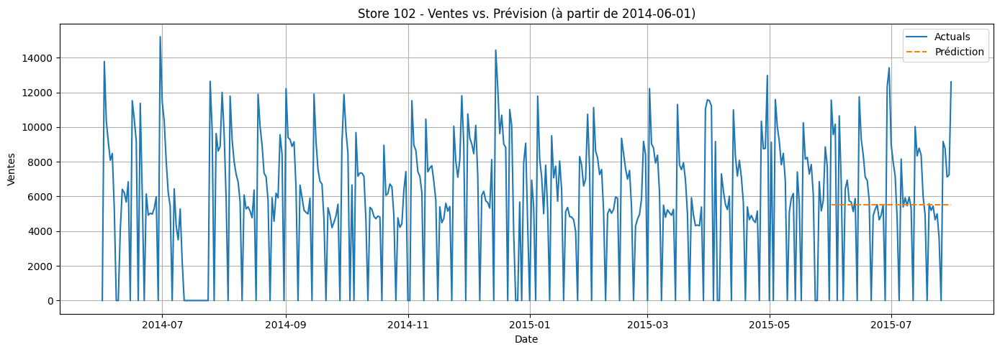

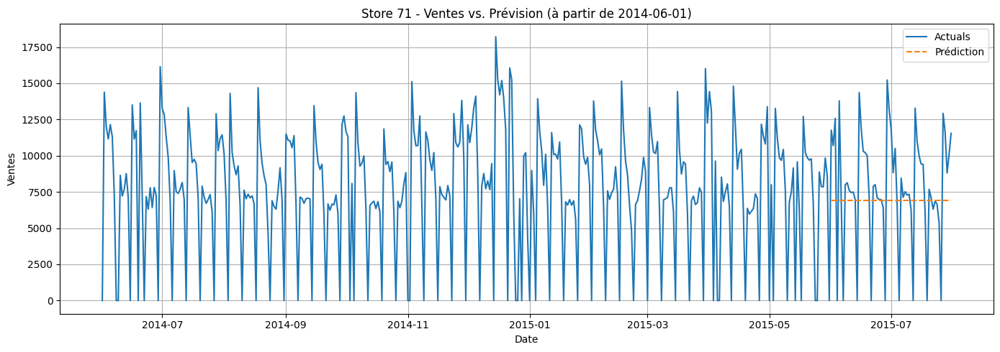

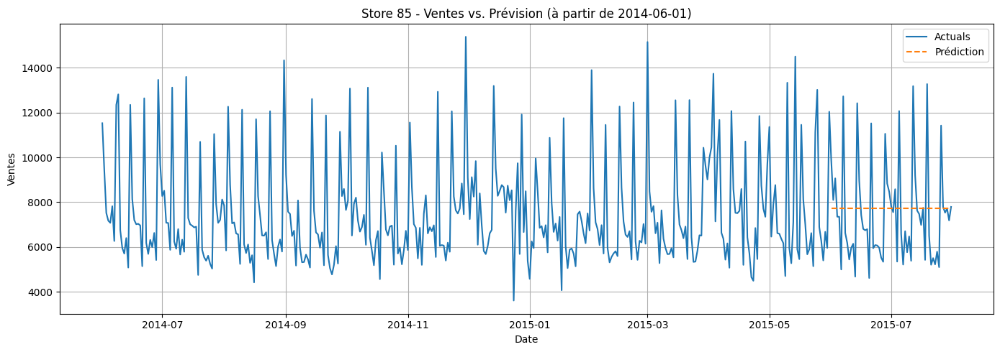

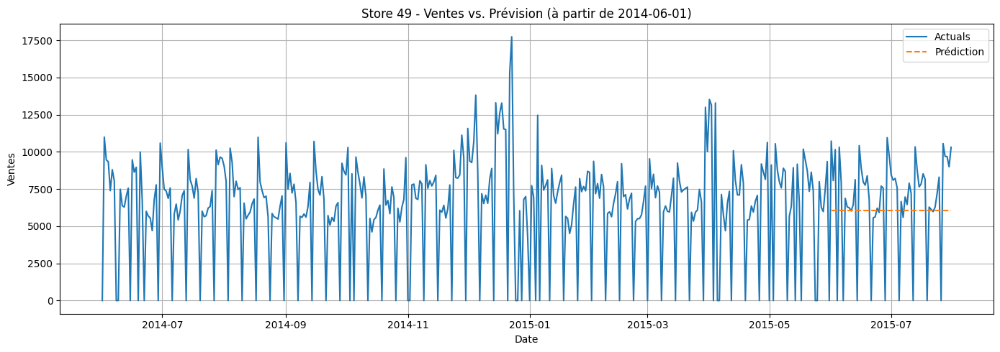

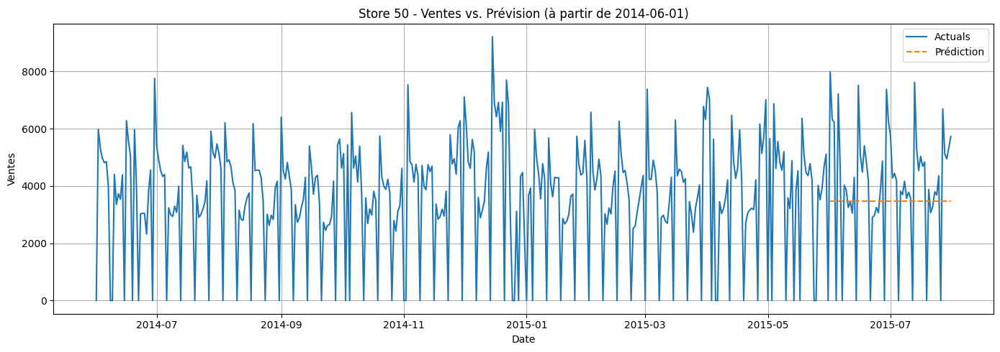

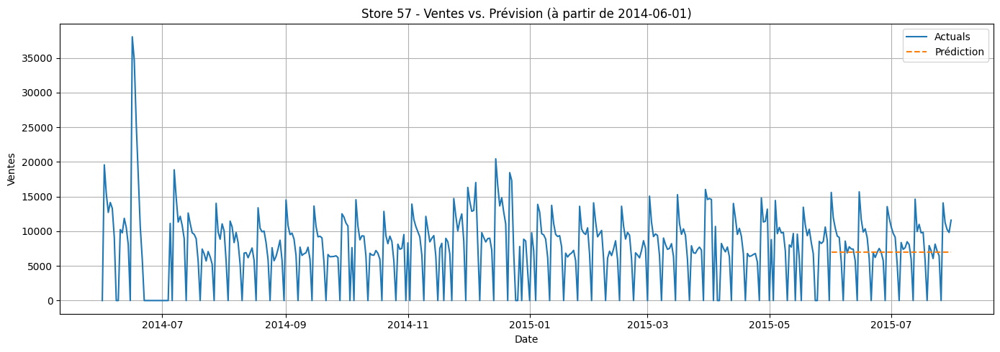

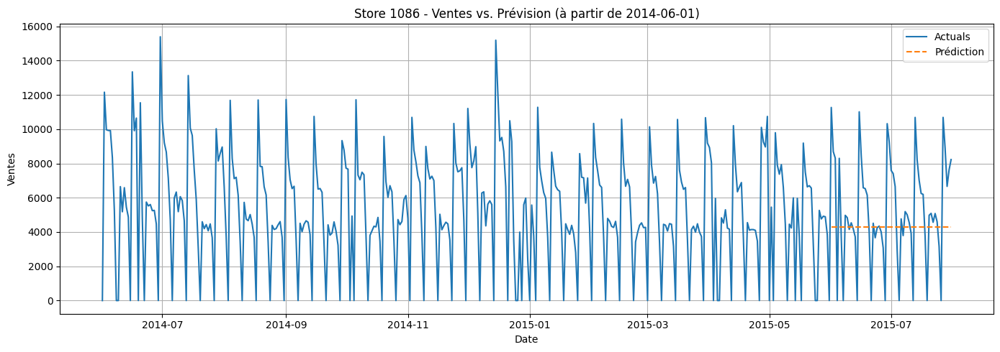

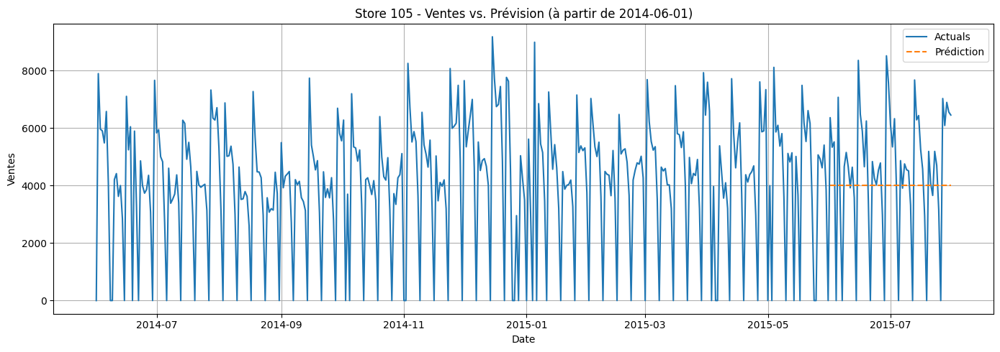

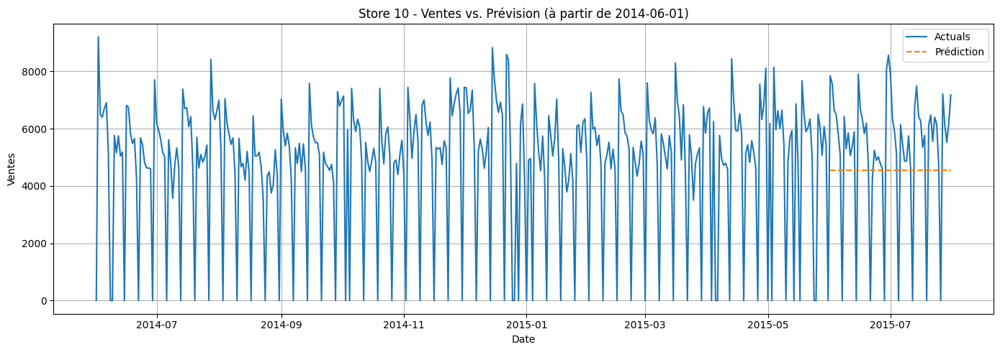

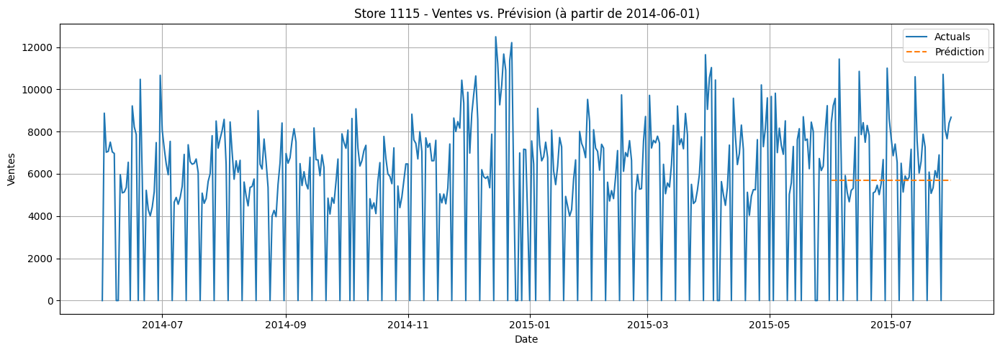

In [22]:
df_combined = pd.concat([df_train, df_test_ses])
plot_forecasts(df_combined, store_ids=small_selected_stores, start_date='2014-06-01', forecast_col='Sales_forecast')

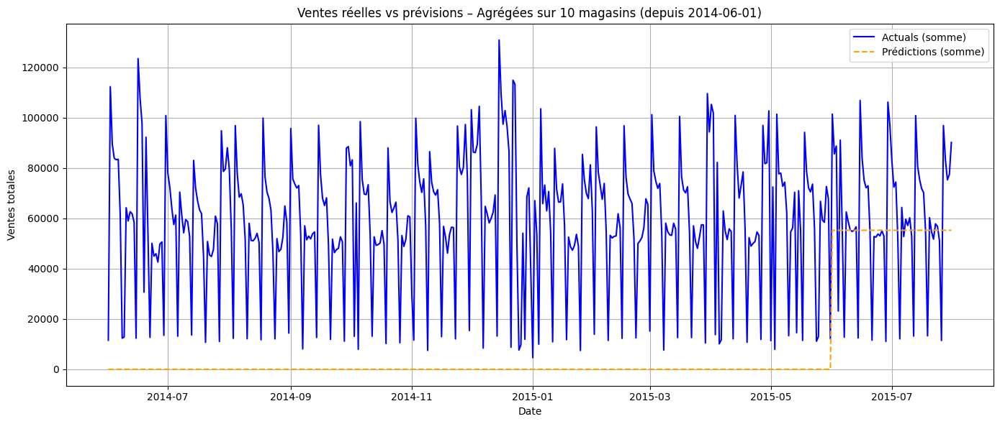

In [23]:
plot_aggregated_forecast(df_combined, store_ids=selected_stores, start_date='2014-06-01')

## 2.3 Baseline 3: Holt-Winters

In [24]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

def holt_winters_forecast(df_train, df_test, forecast_horizon=180, seasonal_periods=365, seasonal='add', smoothing_trend=0.01):
    """
    Applique Holt-Winters (trend + saisonnalité) pour chaque magasin.

    Args:
        df_train (pd.DataFrame): Doit contenir les colonnes 'Store', 'date', 'Sales'
        df_test (pd.DataFrame): Même structure que df_train
        forecast_horizon (int): Nombre de jours à prédire
        seasonal_periods (int): Période de saisonnalité (ex: 7 pour hebdomadaire)
        seasonal (str): 'add' ou 'mul' selon le type de saisonnalité

    Returns:
        df_test_hw (pd.DataFrame): Identique à df_test avec colonne 'Sales_forecast_hw'
    """
    df_test = df_test.copy()
    df_test['date'] = pd.to_datetime(df_test['date'])
    df_train['date'] = pd.to_datetime(df_train['date'])

    df_test['Sales_forecast'] = np.nan

    for store_id in df_test['Store'].unique():
        train_store = df_train[df_train['Store'] == store_id].sort_values('date')
        test_store = df_test[df_test['Store'] == store_id].sort_values('date')

        sales = train_store['Sales'].values

        if len(sales) >= seasonal_periods * 2:  # Au moins 2 saisons
            try:
                model = ExponentialSmoothing(
                    sales,
                    trend='add',
                    seasonal=seasonal,
                    seasonal_periods=seasonal_periods
                )
                fit = model.fit(smoothing_trend=smoothing_trend, optimized=True)
                forecast = fit.forecast(forecast_horizon)

                # Appliquer les prévisions à la partie correspondante du test
                df_test.loc[test_store.index[:forecast_horizon], 'Sales_forecast'] = forecast[:len(test_store)]
            except Exception as e:
                print(f"Erreur pour le Store {store_id}: {e}")
        else:
            print(f"[!] Données insuffisantes pour le Store {store_id}")

    return df_test

In [26]:
#Params
split_date = pd.to_datetime('2015-02-01')
forecast_horizon = 180
seasonal_periods = 7
seasonal_type = 'add'

In [27]:
with mlflow.start_run(run_name="Holt_Winters"):
    # 1. Split
    df_train, df_test = prepare_train_test_by_store(df_simple, split_date, selected_stores)

    # 2. Appliquer Holt-Winters (ex: avec saisonnalité hebdomadaire)
    df_test_hw = holt_winters_forecast(df_train, df_test, forecast_horizon=forecast_horizon, seasonal_periods=seasonal_periods, seasonal=seasonal_type)

    # 3. Évaluation
    y_true = df_test_hw['Sales']
    y_pred = df_test_hw['Sales_forecast']

    rmse_val = rmse(y_true, y_pred)
    rmspe_val = rmspe(y_true, y_pred)
    mae_val = mae(y_true, y_pred)

    print("Évaluation Holt-Winters :")
    print(f"RMSE  : {rmse_val:,.2f}")
    print(f"RMSPE : {rmspe_val:,.4f}")
    print(f"MAE   : {mae_val:,.2f}")

    # 4. Log des métriques
    mlflow.log_metric("RMSE", round(rmse_val,2))
    mlflow.log_metric("RMSPE", rmspe_val)
    mlflow.log_metric("MAE", mae_val)

    # 5. Log du modèle
    df_test_hw[['Store', 'date', 'Sales_forecast']].to_csv("prévisions/holt_winters_predictions.csv", index=False)
    mlflow.log_artifact("holt_winters_predictions.csv")

    # 6. Paramètres de l'expérience
    mlflow.log_param("model_type", "holt_winters")
    mlflow.log_param("n_stores", n_stores)
    mlflow.log_param("split_date", split_date.strftime("%Y-%m-%d"))
    mlflow.log_param("seasonal_periods", seasonal_periods)
    mlflow.log_param("seasonal_type", seasonal_type)

Magasins sélectionnés: [np.int64(10), np.int64(49), np.int64(50), np.int64(57), np.int64(71), np.int64(85), np.int64(102), np.int64(105), np.int64(1086), np.int64(1115)]
Taille train: (7610, 3), test: (1810, 3)
Évaluation Holt-Winters :
RMSE  : 2,546.56
RMSPE : 0.3836
MAE   : 1,777.20


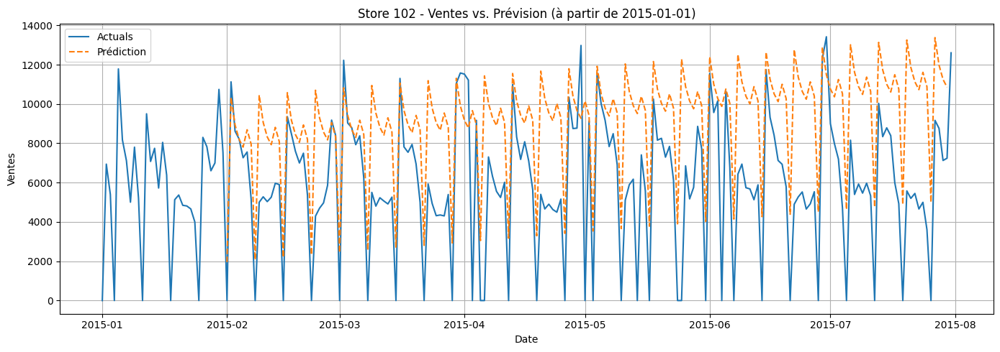

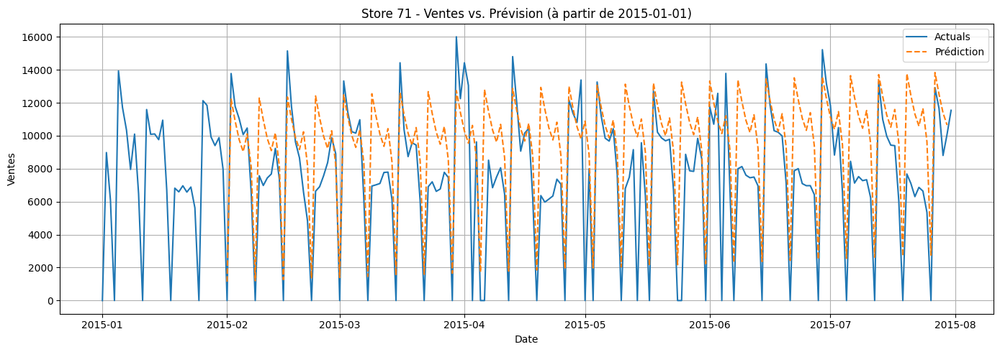

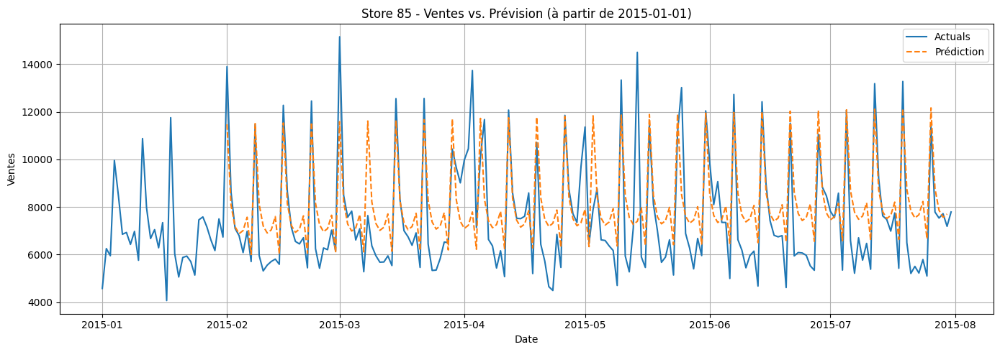

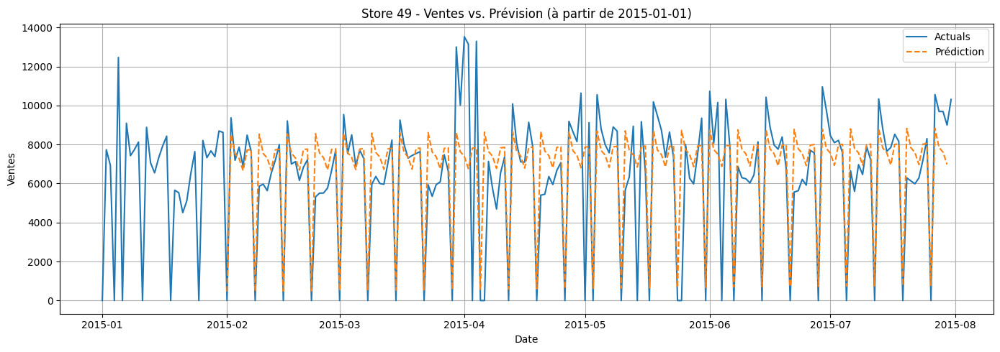

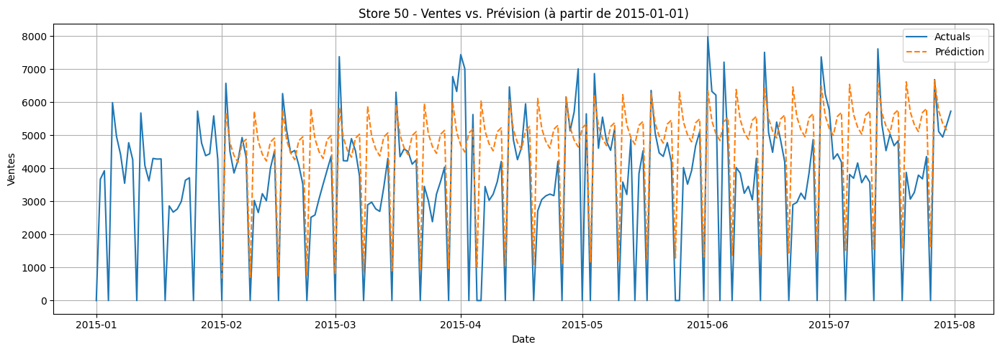

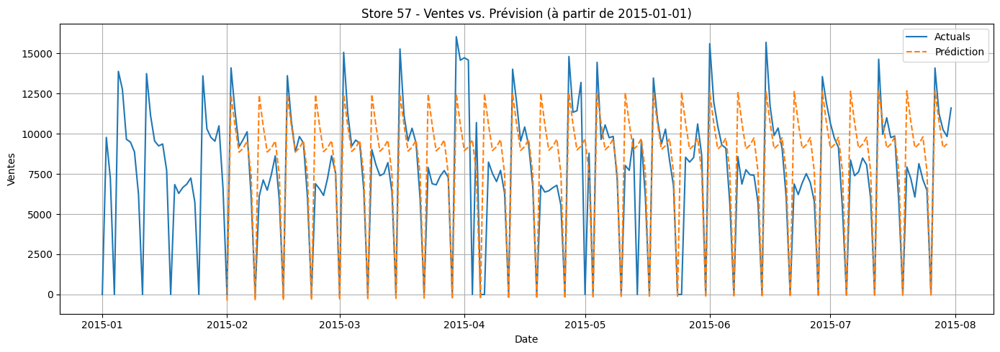

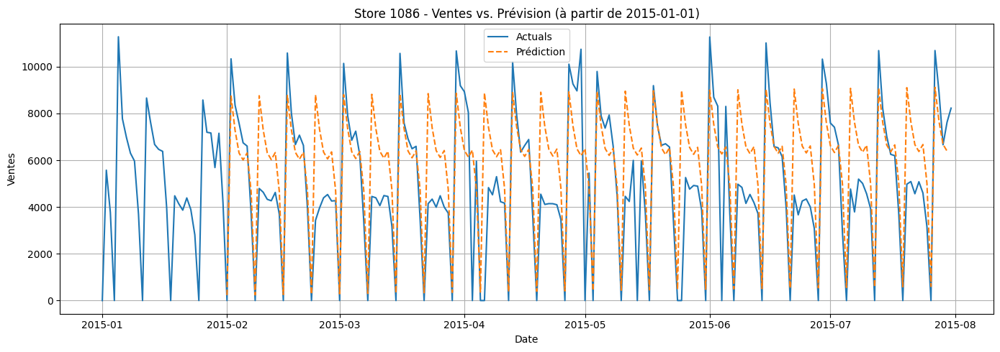

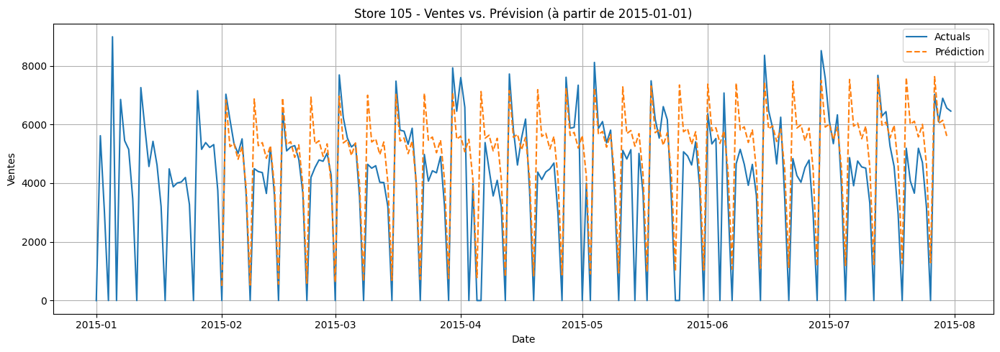

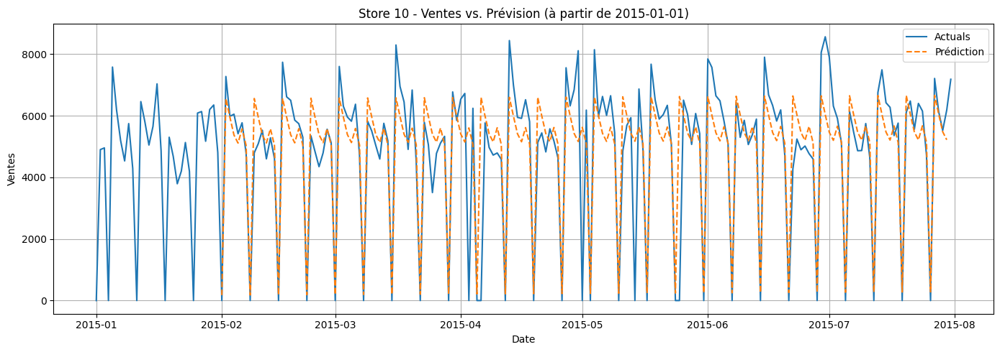

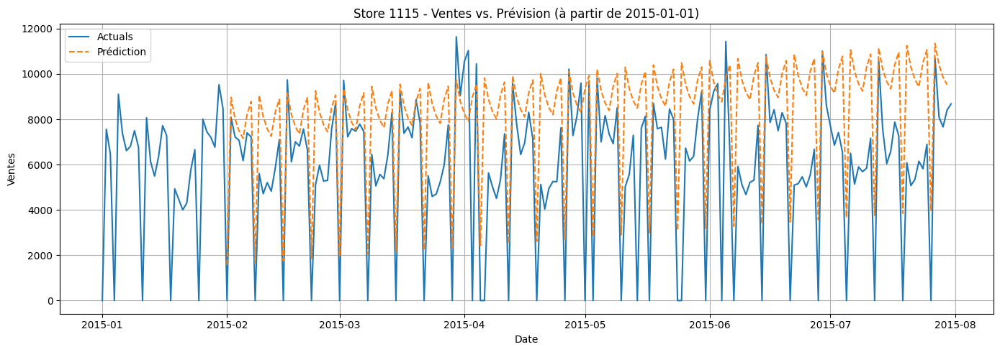

In [28]:
df_combined = pd.concat([df_train, df_test_hw])
plot_forecasts(df_combined, store_ids=selected_stores, start_date='2015-01-01', forecast_col='Sales_forecast')

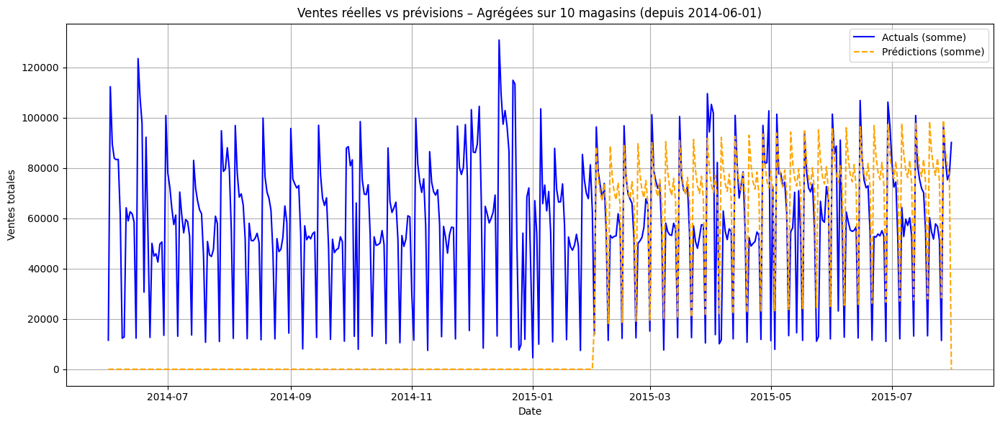

In [29]:
plot_aggregated_forecast(df_combined, store_ids=selected_stores, start_date='2014-06-01')

Conclusion:
Holt-Winters est meilleur en absolu (plus proche des vraies valeurs en moyenne).
Mais pire en relatif (RMSPE): l'erreur moyenne par rapport aux ventes réelles est plus grande.

Holt-Winters prédit mieux en moyenne (moins d’écart brut).
Mais il peut mal prédire sur des jours où les ventes sont faibles (ex. dimanche ou jours fermés), ce qui pénalise beaucoup le RMSPE.

# 4. Prophet X LGBM

In [30]:
# Prophet x LGBM - Multi-store Forecasting Pipeline

import pandas as pd
import numpy as np
from prophet import Prophet
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from tqdm import tqdm



Importing plotly failed. Interactive plots will not work.


## 4.1 Fonctions

In [31]:
# ------------------------------
# STEP 1 - Prophet decomposition par store
# ------------------------------

def decompose_with_prophet(df, split_date, horizon, date_col='date', store_col='Store', target_col='Sales'):
    """Décompose une série temporelle par magasin via Prophet.

    Entraîne un modèle Prophet par magasin, prédit l'horizon et combine
    les composantes (tendance, saisonnalités) avec les valeurs réelles et
    les résidus.

    Args:
        df: DataFrame des séries temporelles (colonnes: date_col, store_col, target_col).
        split_date: Date de séparation train/test ('YYYY-MM-DD').
        horizon: Nombre de périodes futures à prédire.
        date_col: Nom de la colonne de date ('date' par défaut).
        store_col: Nom de la colonne d'identifiant de magasin ('Store' par défaut).
        target_col: Nom de la colonne cible ('Sales' par défaut).

    Returns:
        DataFrame: Contient les données originales, prédictions Prophet (yhat),
                   tendance, saisonnalités (weekly, yearly), résidus et store_col.
    """
    df = df.copy()
    df_prophet_all = []

    for store_id in tqdm(df[store_col].unique(), desc="Prophet decomposition"):
        df_store = df[df[store_col] == store_id].copy()
        df_store = df_store[[date_col, target_col]].rename(columns={date_col: 'ds', target_col: 'y'})
        df_store['ds'] = pd.to_datetime(df_store['ds'])

        # 1. Découpe train/test
        df_train = df_store[df_store['ds'] <= split_date]

        # 2. Fit Prophet uniquement sur le train
        m = Prophet(
            seasonality_mode='additive', # vs "additive" "multiplicative"
            yearly_seasonality=True,
            weekly_seasonality=True,
            daily_seasonality=False
        )
        m.fit(df_train)

        # 3. Génère une fenêtre qui couvre toute la période future
        future = m.make_future_dataframe(periods=horizon)
        forecast = m.predict(future)

        # 4. Merge avec les vraies valeurs
        df_out = df_store.merge(forecast[['ds', 'trend', 'weekly', 'yearly', 'yhat']], on='ds', how='left')
        df_out['residual'] = df_out['y'] - df_out['yhat']
        df_out['Store'] = store_id

        df_prophet_all.append(df_out)

    return pd.concat(df_prophet_all, ignore_index=True)

In [32]:
# ------------------------------
# STEP 2 - Feature engineering + Dataset construction
# ------------------------------
def create_features(df):
    """Crée des features temporelles et des lags sur les résidus.

    Génère des features comme le jour de la semaine, le mois, le jour du mois
    et la semaine de l'année à partir de la colonne 'ds'. Calcule également
    des lags des résidus ('residual') pour chaque magasin. 

    Args:
        df: DataFrame contenant au moins les colonnes 'ds' (datetime) et
            'residual' (valeurs résiduelles). Doit également contenir 'Store'
            pour le calcul des lags par groupe.

    Returns:
        DataFrame: DataFrame avec les nouvelles features temporelles et les
                   lags des résidus. Les lignes contenant des NaN (introduits
                   par les lags) sont supprimées.
    """
    
    df = df.copy()
    df['dayofweek'] = df['ds'].dt.dayofweek
    df['month'] = df['ds'].dt.month
    df['day'] = df['ds'].dt.day
    df['weekofyear'] = df['ds'].dt.isocalendar().week.astype(int)

    # Lags on residuals
    for lag in [1, 2, 3, 7, 28, 30, 60]:
        df[f'residual_lag_{lag}'] = df.groupby('Store')['residual'].shift(lag)

    # # External features (optional)
    # if exog_cols:
    #     df = pd.concat([df, df[exog_cols]], axis=1)

    df.dropna(inplace=True)
    return df


In [33]:
# ------------------------------
# STEP 3 - Train & Predict LGBM
# ------------------------------

def train_lgbm(df, horizon):
    """Entraîne un modèle LightGBM sur les résidus de prédictions.

    Utilise toutes les colonnes de `df` sauf celles spécifiées pour entraîner
    un modèle de régression sur la colonne 'residual'. Effectue un split
    train/test basé sur l'horizon et le nombre de magasins.

    Args:
        df: DataFrame contenant les features et la colonne 'residual'.
        horizon: Nombre de périodes futures pour la taille de l'ensemble test.

    Returns:
        LGBMRegressor: Modèle LightGBM entraîné.
    """
    
    df = df.copy()
    df.sort_values(['Store', 'ds'], inplace=True)
    
    # Colonnes à exclure 
    exclude_cols = ['y', 'residual', 'yhat', 'ds', 'date', 'Sales', 'Sales_forecast']
    
    # Création de la liste des features par exclusion
    features = [col for col in df.columns if col not in exclude_cols]

    X = df[features]
    y = df['residual']

    # Split globalement (en triant pour éviter mélange)
    X_train, X_test = X.iloc[:-horizon * df['Store'].nunique()], X.iloc[-horizon * df['Store'].nunique():]
    y_train, y_test = y.iloc[:-horizon * df['Store'].nunique()], y.iloc[-horizon * df['Store'].nunique():]

    model = LGBMRegressor(objective='regression_l1', random_state=42)
    model.fit(X_train, y_train)

    # Récupérer les index (alignés avec df) de X_train
    train_indices = X_train.index
    
    # Extraire les dates correspondantes depuis df
    max_date_train = df.loc[train_indices, 'ds'].max()

    # On ne retourne rien ici, les prédictions seront faites à l’extérieur, par magasin
    return model

In [34]:
def predict_lgbm(df, model, horizon):
    """Génère les prédictions en combinant les prédictions du modèle LightGBM
    sur les résidus avec les composantes Prophet (tendance et saisonnalités).

    Pour chaque magasin, sélectionne les dernières `horizon` périodes, prédit
    les résidus avec le modèle `model` et les ajoute aux composantes Prophet
    correspondantes.

    Args:
        df: DataFrame contenant les features, la tendance ('trend'), les
            saisonnalités ('weekly', 'yearly') et la colonne cible ('y') = Sales.
        model: Modèle LightGBM entraîné pour prédire les résidus.
        horizon: Nombre de périodes futures à prédire.

    Returns:
        DataFrame: DataFrame contenant les prédictions ('Sales_forecast') pour
                   l'horizon spécifié, avec les colonnes 'Store', 'date' et
                   les ventes réelles ('Sales').
    """
    
    # Colonnes à exclure 
    exclude_cols = ['y', 'residual', 'yhat', 'ds', 'date', 'Sales', 'Sales_forecast']
    
    # Création de la liste des features par exclusion
    features = [col for col in df.columns if col not in exclude_cols]

    all_forecasts = []

    for store_id in df['Store'].unique():
        df_store = df[df['Store'] == store_id].copy()
        df_store.sort_values('ds', inplace=True)

        X_test = df_store[features].iloc[-horizon:]
        y_true = df_store['y'].iloc[-horizon:].values

        y_pred = model.predict(X_test)
        final_pred = (
            y_pred
            + df_store.iloc[-horizon:]['trend'].values
            + df_store.iloc[-horizon:]['weekly'].values
            + df_store.iloc[-horizon:]['yearly'].values
        )

        forecast_df = df_store.iloc[-horizon:][['Store', 'ds', 'y']].copy()
        forecast_df.rename(columns={'ds': 'date', 'y': 'Sales'}, inplace=True)
        forecast_df['Sales_forecast'] = final_pred

        all_forecasts.append(forecast_df)

    df_forecast = pd.concat(all_forecasts, ignore_index=True)
    return df_forecast

## 4.2 Prophet X LGBM sans external features

In [35]:
# ------------------------------
# Application
# ------------------------------
df_simple = pd.read_pickle("df_simple.pkl")
store_id = selected_stores
df_store = df_simple[df_simple['Store'].isin(store_id)].copy()
print(df_store['Store'].unique())



[1115   71   85  102  105   10   57   50   49 1086]


In [36]:
horizon = 180
split_date = df_store['date'].max() - pd.Timedelta(days=horizon)
split_date

Timestamp('2015-02-01 00:00:00')

In [37]:
df_prophet = decompose_with_prophet(df_store, split_date, horizon)

Prophet decomposition:   0%|                                                                                                                                | 0/10 [00:00<?, ?it/s]17:38:09 - cmdstanpy - INFO - Chain [1] start processing
17:38:09 - cmdstanpy - INFO - Chain [1] done processing
Prophet decomposition:  10%|████████████                                                                                                            | 1/10 [00:00<00:03,  2.65it/s]17:38:10 - cmdstanpy - INFO - Chain [1] start processing
17:38:10 - cmdstanpy - INFO - Chain [1] done processing
Prophet decomposition:  20%|████████████████████████                                                                                                | 2/10 [00:00<00:02,  2.89it/s]17:38:10 - cmdstanpy - INFO - Chain [1] start processing
17:38:10 - cmdstanpy - INFO - Chain [1] done processing
Prophet decomposition:  30%|████████████████████████████████████                                                            

In [38]:
df_prophet.head()

,ds,y,trend,weekly,yearly,yhat,residual,Store
0,2013-01-01,0,4256.383196,573.831612,-449.091264,4381.123544,-4381.123544,1115
1,2013-01-02,3697,4258.546831,351.230174,-515.460083,4094.316922,-397.316922,1115
2,2013-01-03,4297,4260.710466,180.731030,-570.795240,3870.646256,426.353744,1115
3,2013-01-04,4540,4262.874101,1032.878958,-614.988310,4680.764749,-140.764749,1115
4,2013-01-05,4771,4265.037736,1481.490930,-648.120382,5098.408284,-327.408284,1115


In [39]:
df_prophet.describe()

,ds,y,trend,weekly,yearly,yhat,residual,Store
count,9420,9420.000000,9420.000000,9420.000000,9420.000000,9420.000000,9420.000000,9420.000000
mean,2014-04-16 11:59:59.999999744,5852.710191,5841.909892,2.886151,-14.846199,5829.949845,22.760346,273.000000
min,2013-01-01 00:00:00,0.000000,1606.069237,-8909.841498,-2052.562830,-4247.902536,-14859.852065,10.000000
25%,2013-08-24 00:00:00,4057.500000,4490.037128,-513.374812,-256.303137,4357.070766,-861.527537,50.000000
50%,2014-04-16 12:00:00,5838.500000,5801.866705,657.759800,-59.751173,6131.747060,66.793377,78.000000
75%,2014-12-08 00:00:00,7753.000000,7287.335245,1232.471655,149.304889,7552.732278,1036.631166,105.000000
max,2015-07-31 00:00:00,38037.000000,9588.980319,4389.439072,3594.501028,17428.941687,24199.292708,1115.000000
std,NaN,3701.303847,1706.157555,2505.697854,530.476320,3076.391429,2110.655062,414.663542


In [40]:
df_feat = create_features(df_prophet)#, exog_cols=['Promo', 'Holiday'])

In [41]:
df_feat.head()

,ds,y,trend,weekly,yearly,yhat,residual,Store,dayofweek,month,day,weekofyear,residual_lag_1,residual_lag_2,residual_lag_3,residual_lag_7,residual_lag_28,residual_lag_30,residual_lag_60
60,2013-03-02,6027,4386.201386,1481.490930,202.358245,6070.050560,-43.050560,1115,5,3,2,9,-527.496795,739.382158,-519.710769,8.333638,-364.362791,243.698999,-4381.123544
61,2013-03-03,0,4388.365024,-5070.221774,216.255934,-465.600816,465.600816,1115,6,3,3,9,-43.050560,-527.496795,739.382158,592.527617,775.336638,-740.133307,-397.316922
62,2013-03-04,7150,4390.528661,1450.059069,229.203402,6069.791131,1080.208869,1115,0,3,4,10,465.600816,-43.050560,-527.496795,-2359.273120,925.175720,-364.362791,426.353744
63,2013-03-05,6442,4392.692299,573.831612,241.150240,5207.674152,1234.325848,1115,1,3,5,10,1080.208869,465.600816,-43.050560,-854.368025,1258.190293,775.336638,-140.764749
64,2013-03-06,5654,4394.855937,351.230174,252.062598,4998.148709,655.851291,1115,2,3,6,10,1234.325848,1080.208869,465.600816,-519.710769,165.797474,925.175720,-327.408284


In [42]:
model = train_lgbm(df_feat, horizon)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2664
[LightGBM] [Info] Number of data points in the train set: 7020, number of used features: 15
[LightGBM] [Info] Start training from score 56.141029


In [43]:
df_forecast = predict_lgbm(df_feat, model, horizon)
df_forecast.head()

,Store,date,Sales,Sales_forecast
0,1115,2015-02-02,8090,8846.251701
1,1115,2015-02-03,7222,6541.940132
2,1115,2015-02-04,7066,6563.784300
3,1115,2015-02-05,6173,6674.429512
4,1115,2015-02-06,7400,6864.167782


In [44]:
with mlflow.start_run(run_name="LightGBM_X_Prophet_no_ext"):
    # # 1. Entraînement du modèle
    # horizon = 180
    # model = train_lgbm(df_feat, horizon=horizon)

    # 2. Prédiction + évaluation par magasin
    features = ['trend', 'weekly', 'yearly', 'dayofweek', 'month', 'day', 'weekofyear', 'Store'] + \
               [col for col in df_feat.columns if 'residual_lag_' in col]

    maes = []
    rmses = []
    rmspes = []
    results = []

    for store_id in df_feat['Store'].unique():
        df_store = df_feat[df_feat['Store'] == store_id].copy()
        df_store.sort_values('ds', inplace=True)

        X_test = df_store[features].iloc[-horizon:]
        y_true = df_store['y'].iloc[-horizon:].values

        y_pred = model.predict(X_test)
        final_pred = (
            y_pred
            + df_store.iloc[-horizon:]['trend'].values
            + df_store.iloc[-horizon:]['weekly'].values
            + df_store.iloc[-horizon:]['yearly'].values
        )

        rmse_val = rmse(y_true, final_pred)
        rmspe_val = rmspe(y_true, final_pred)
        mae_val = mae(y_true, final_pred)

        maes.append(mae_val)
        rmses.append(rmse_val)
        rmspes.append(rmspe_val)

        # Sauvegarde des résultats
        results.append(pd.DataFrame({
            'Store': store_id,
            'date': df_store.iloc[-horizon:]['ds'].values,
            # 'True_Sales': y_true,
            'Sales_forecast': final_pred
        }))

        

    # 3. Log des métriques moyennes
    print("Évaluation Prophet X LGBM :")
    print(f"RMSE  : {np.mean(rmses):,.2f}")
    print(f"RMSPE : {np.mean(rmspes):,.4f}")
    print(f"MAE   : {np.mean(maes):,.2f}")


    
    mlflow.log_metric("MAE", round(np.mean(maes),2))
    mlflow.log_metric("RMSE", round(np.mean(rmses),2))
    mlflow.log_metric("RMSPE", round(np.mean(rmspes),2))

    # 4. Log du fichier de prédiction
    df_preds = pd.concat(results, ignore_index=True)
    pred_path = "prévisions/lgbm_preds.csv"
    df_preds.to_csv(pred_path, index=False)
    mlflow.log_artifact(pred_path)

    # 5. Paramètres du run
    mlflow.log_param("model_type", "lightgbm_with_decomposition")
    mlflow.log_param("n_stores", df_feat['Store'].nunique())
    mlflow.log_param("horizon", horizon)


Évaluation Prophet X LGBM :
RMSE  : 1,762.23
RMSPE : 0.1941
MAE   : 1,118.40


In [46]:
df_preds.head()

,Store,date,Sales_forecast
0,1115,2015-02-02,8107.685507
1,1115,2015-02-03,7290.598372
2,1115,2015-02-04,7302.806293
3,1115,2015-02-05,7254.160904
4,1115,2015-02-06,7512.825973


In [47]:
# Concaténation de l'historique

# Préparer le DataFrame historique pour concaténation
df_hist = df_feat.copy()
df_hist = df_hist[['Store', 'ds', 'y']].copy()
df_hist.rename(columns={'ds': 'date', 'y': 'Sales'}, inplace=True)
df_hist = df_hist[~df_hist['date'].isin(df_forecast['date'])]  # éviter les doublons

# Fusion
df_combined = pd.concat([df_hist, df_forecast], ignore_index=True)

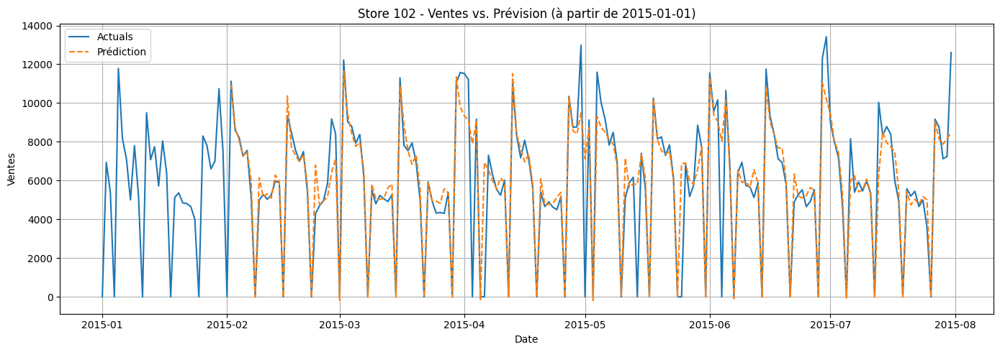

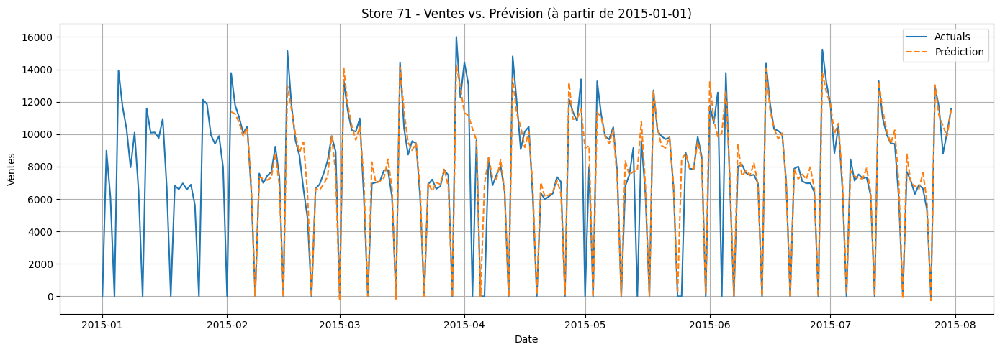

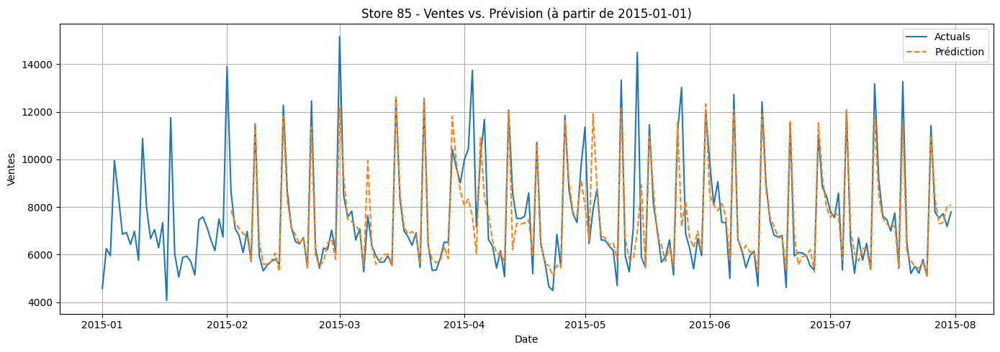

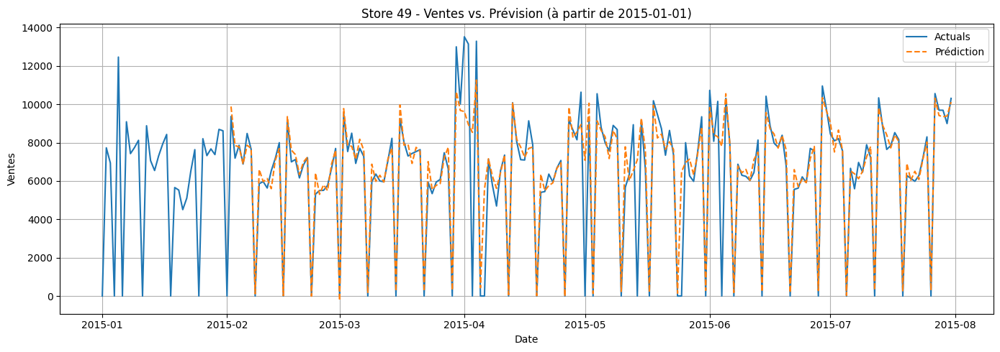

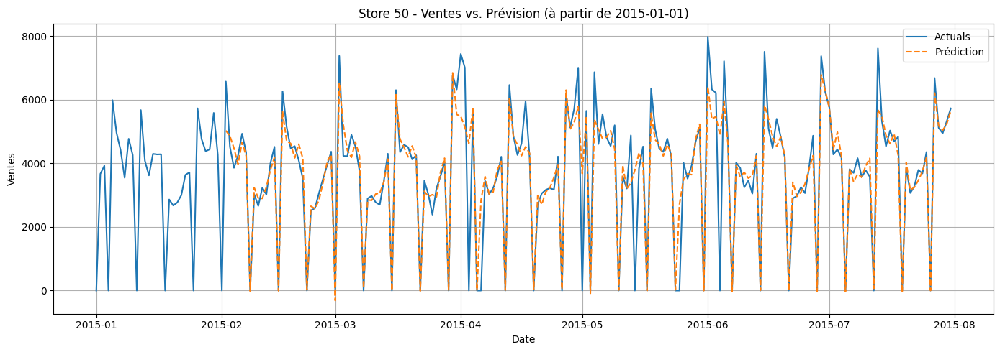

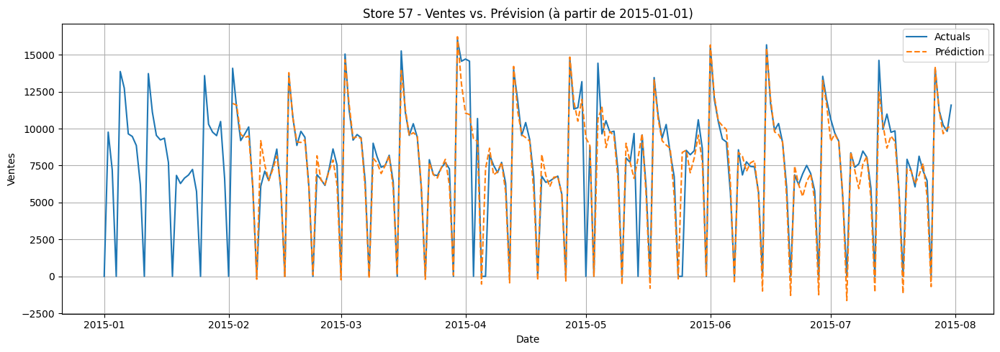

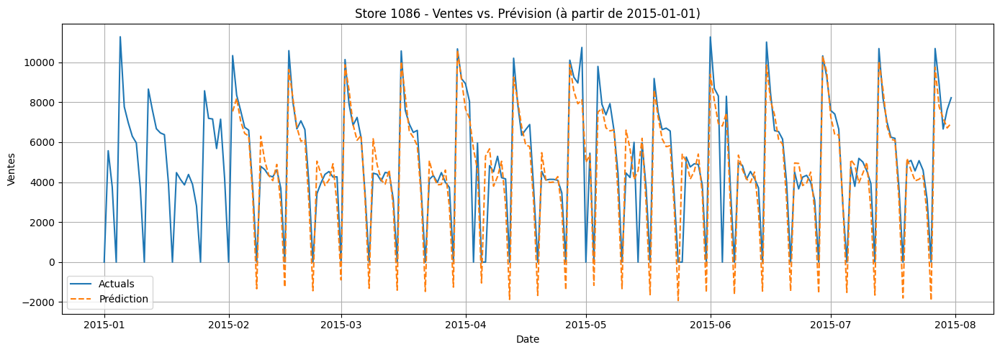

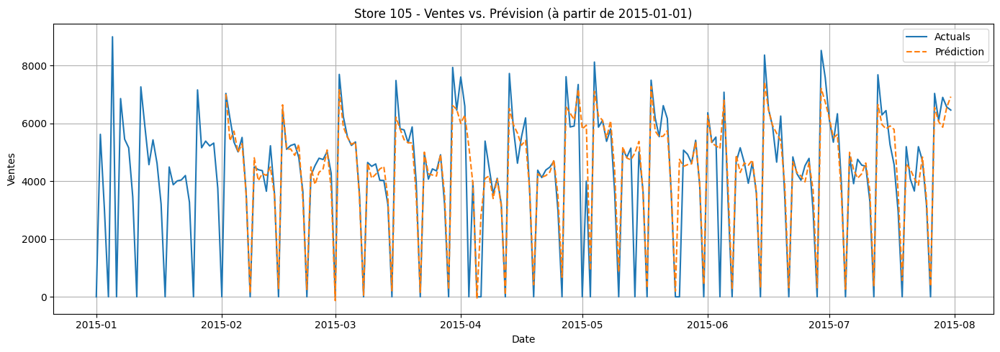

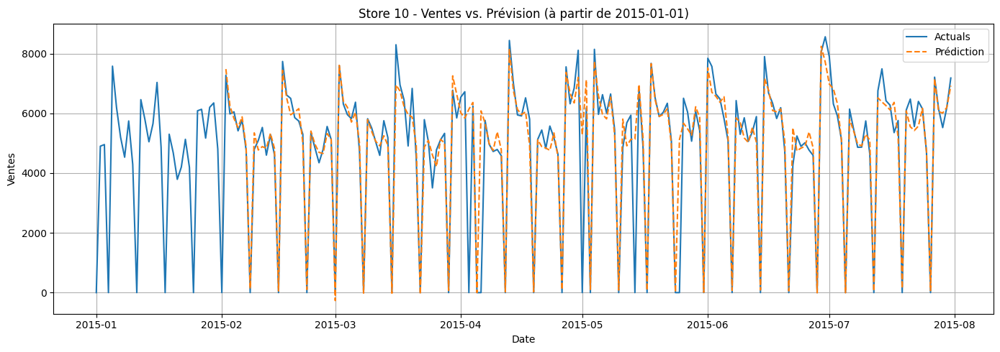

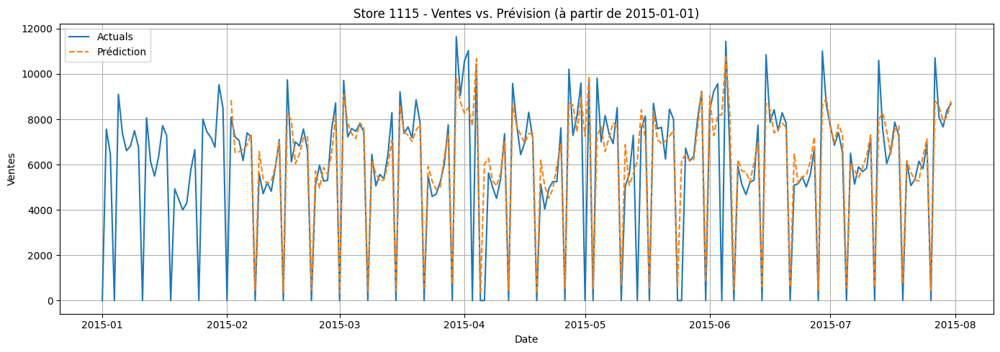

In [48]:
plot_forecasts(df_combined, store_ids=selected_stores, start_date='2015-01-01')

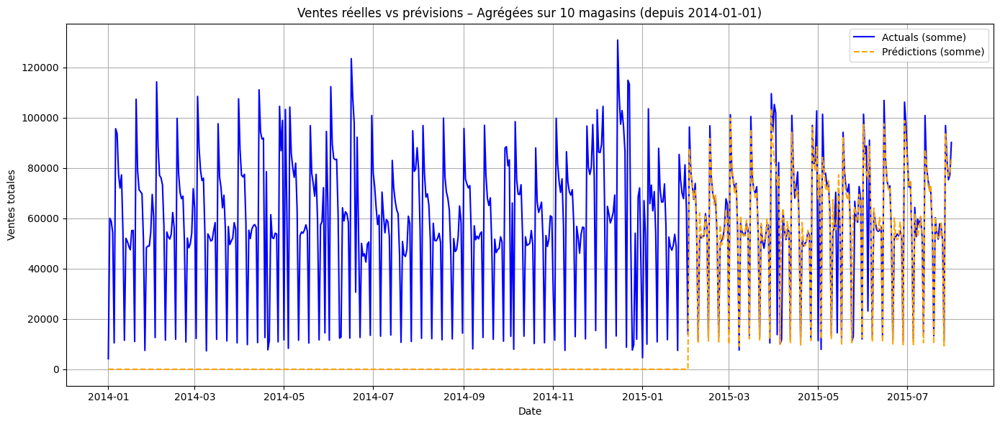

In [49]:
plot_aggregated_forecast(df_combined, store_ids=selected_stores, start_date='2014-01-01')

visualisation des trend, saisonnalité weekly et yearly trouvées par Prophet pour un magasin donné:

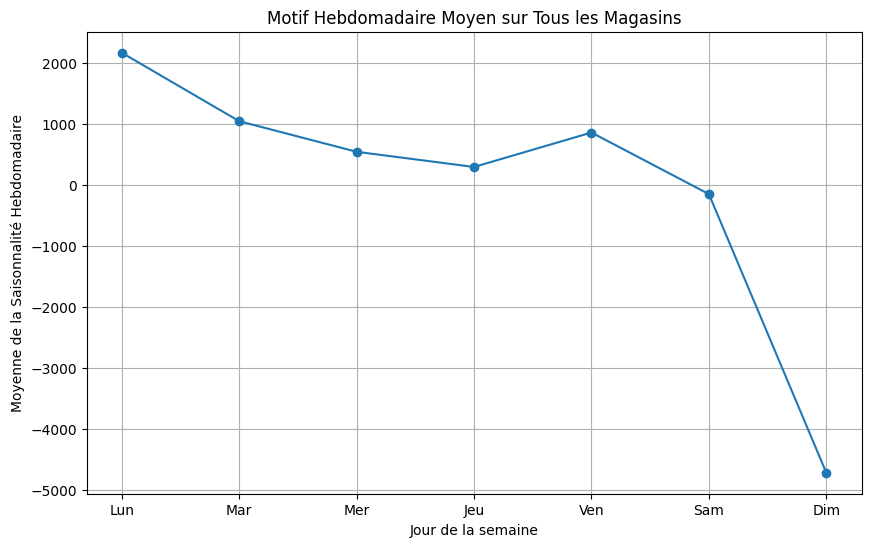

In [50]:
# Création d'une colonne 'day_of_week'
df_prophet['day_of_week'] = df_prophet['ds'].dt.dayofweek

# Calcul de la moyenne de la composante 'weekly' par jour de la semaine, groupée par magasin
weekly_patterns_by_store = df_prophet.groupby(['Store', 'day_of_week'])['weekly'].mean().unstack()

# Calcul de la moyenne sur tous les magasins pour chaque jour de la semaine
average_weekly_pattern = weekly_patterns_by_store.mean(axis=0)

# Création d'un graphique
plt.figure(figsize=(10, 6))
plt.plot(average_weekly_pattern.index, average_weekly_pattern.values, marker='o')
plt.xticks(range(7), ['Lun', 'Mar', 'Mer', 'Jeu', 'Ven', 'Sam', 'Dim'])
plt.title('Motif Hebdomadaire Moyen sur Tous les Magasins')
plt.xlabel('Jour de la semaine')
plt.ylabel('Moyenne de la Saisonnalité Hebdomadaire')
plt.grid(True)
plt.show()

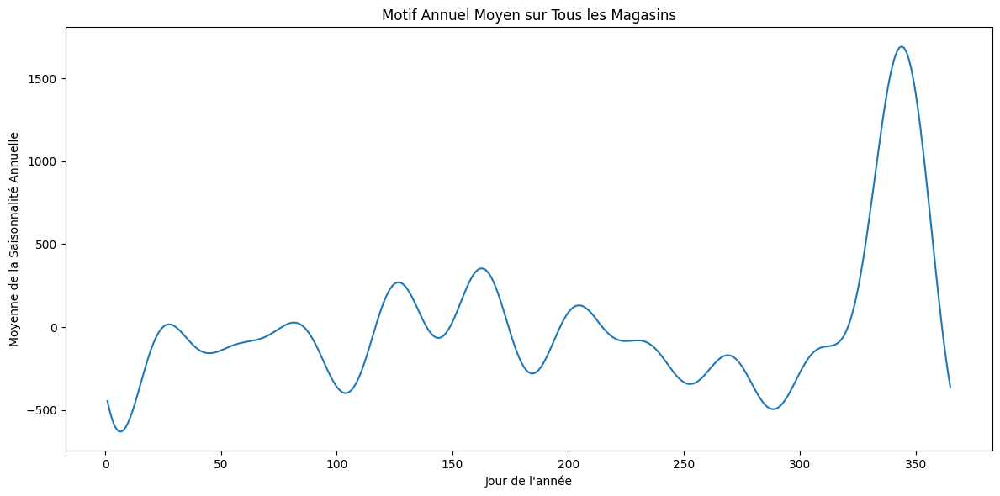

In [51]:
 # Création d'une colonne 'dayofyear'
df_prophet['dayofyear'] = df_prophet['ds'].dt.dayofyear

# Calcul de la moyenne de la composante 'yearly' par jour de l'année, groupée par magasin
yearly_patterns_by_store = df_prophet.groupby(['Store', 'dayofyear'])['yearly'].mean().unstack()

# Calcul de la moyenne sur tous les magasins pour chaque jour de l'année
average_yearly_pattern = yearly_patterns_by_store.mean(axis=0)

# Création d'un graphique
plt.figure(figsize=(12, 6))
plt.plot(average_yearly_pattern.index, average_yearly_pattern.values)
plt.title('Motif Annuel Moyen sur Tous les Magasins')
plt.xlabel('Jour de l\'année')
plt.ylabel('Moyenne de la Saisonnalité Annuelle')
# plt.grid(True)
# plt.xticks(range(1, 366), [f'J{i}' for i in range(1, 366)], rotation=45, fontsize=8) 
plt.tight_layout()
plt.show()

Visualisation pour un magasin:

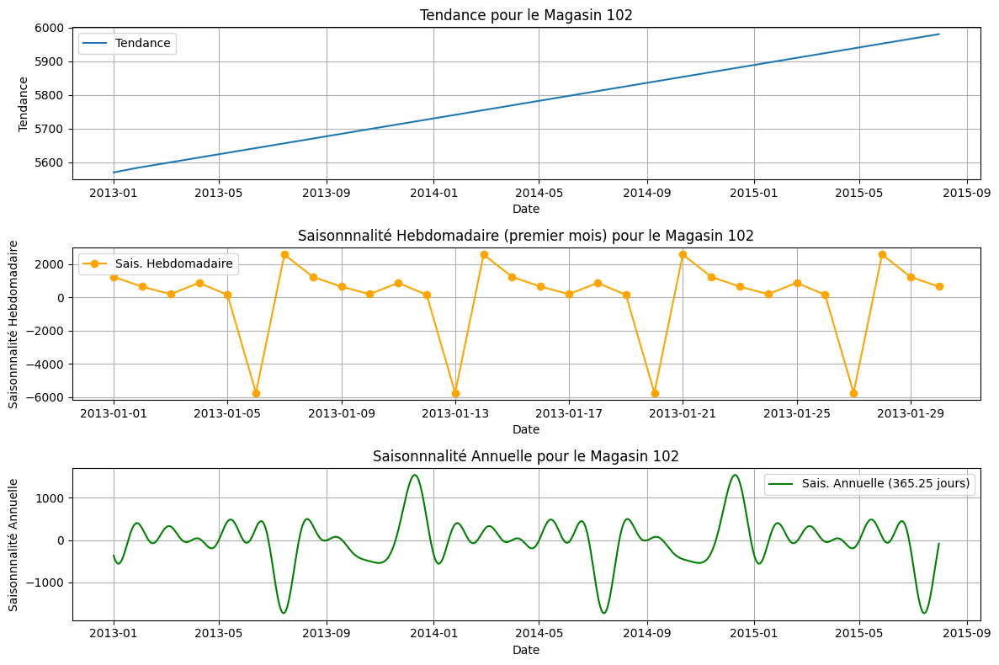

In [52]:
# Choisir un magasin pour lequel afficher les composantes
selected_store_id = selected_stores[0] # Sélectionne le premier magasin

# Filtre le DataFrame pour le magasin sélectionné
df_store_forecast = df_prophet[df_prophet['Store'] == selected_store_id]

# Création d' un modèle Prophet (il n'a pas besoin d'être refitté ici,
# nous utilisons celui déjà entraîné dans la fonction)
m = Prophet(
    seasonality_mode='additive',
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False
)
m.add_seasonality(name='weekly', period=7, fourier_order=3)
m.add_seasonality(name='yearly', period=365.25, fourier_order=10)
m.changepoint_prior_scale = 0.05

# Visualisation
fig, axes = plt.subplots(3, 1, figsize=(12, 8))

# 1. Plot de la tendance
axes[0].plot(df_store_forecast['ds'], df_store_forecast['trend'], label='Tendance')
axes[0].set_title(f'Tendance pour le Magasin {selected_store_id}')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Tendance')
axes[0].legend()
axes[0].grid(True)

# 2. Plot de la saisonnalité hebdomadaire
# axes[1].plot(df_store_forecast['ds'], df_store_forecast['weekly'], label='Sais. Hebdomadaire (7 jours)', color='orange')
# axes[1].set_title(f'Saisonnnalité Hebdomadaire pour le Magasin {selected_store_id}')
# axes[1].set_xlabel('Date')
# axes[1].set_ylabel('Saisonnnalité Hebdomadaire')
# axes[1].legend()
# axes[1].grid(True)
axes[1].plot(df_store_forecast['ds'].head(30), df_store_forecast['weekly'].head(30), label='Sais. Hebdomadaire', color='orange', marker='o')
axes[1].set_title(f'Saisonnnalité Hebdomadaire (premier mois) pour le Magasin {selected_store_id}')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Saisonnnalité Hebdomadaire')
axes[1].legend()
axes[1].grid(True)

# 3. Plot de la saisonnalité annuelle
axes[2].plot(df_store_forecast['ds'], df_store_forecast['yearly'], label='Sais. Annuelle (365.25 jours)', color='green')
axes[2].set_title(f'Saisonnnalité Annuelle pour le Magasin {selected_store_id}')
axes[2].set_xlabel('Date')
axes[2].set_ylabel('Saisonnnalité Annuelle')
axes[2].legend()
axes[2].grid(True)

plt.tight_layout()
plt.show()

Interprétabilité des données: Global avec Shap

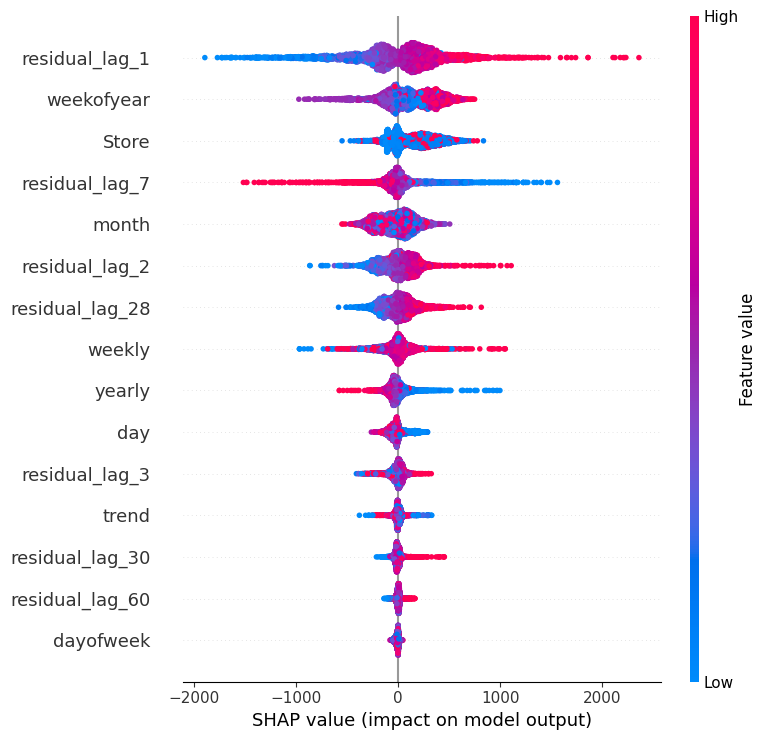

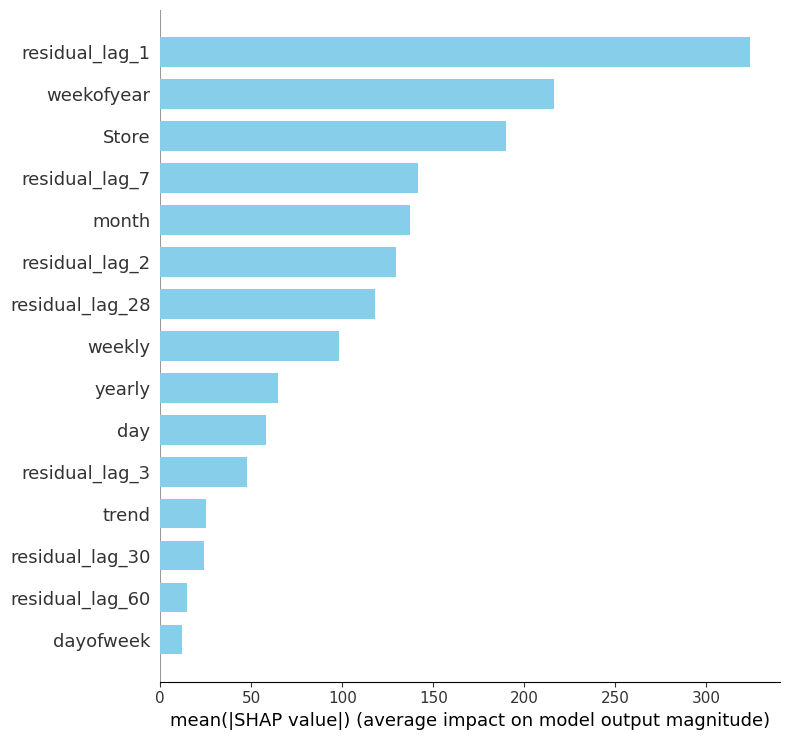

In [53]:
# 1. Préparation des données (mêmes features que celles utilisées pour l'entraînement)
features = ['trend', 'weekly', 'yearly', 'dayofweek', 'month', 'day', 'weekofyear', 'Store'] + \
            [col for col in df_feat.columns if 'residual_lag_' in col]

X = df_feat[features]
y = df_feat['residual']

# échantillonnage pour accélérer SHAP
sample_size = 5000
X_sample = X.sample(n=sample_size, random_state=42)

# 2. Création de l'explainer SHAP
explainer = shap.Explainer(model)  # model = LGBMRegressor
shap_values = explainer(X_sample)

# 3. Résumé global
shap.summary_plot(shap_values, X_sample, feature_names=features)
shap.summary_plot(shap_values, X_sample, feature_names=features, plot_type="bar", color="skyblue")

**Interprétation globale du graphique :**
Le modèle LGBM s'appuie fortement sur les lags des résidus, en particulier le lag de la période précédente (residual_lag_1), pour prédire les erreurs de Prophet. Les aspects temporels (weekofyear, month, les saisonnalités de Prophet) et spécifiques au magasin (Store) sont également importants pour corriger les prédictions. La trend de Prophet et le dayofweek ont une influence plus faible.

**Résumé spécifique de residual_lag_1 :**

L'erreur de prédiction d'hier est le meilleur indicateur de l'erreur d'aujourd'hui. Si Prophet a sous-estimé hier, LGBM a tendance à corriger à la hausse aujourd'hui, et inversement. Cela révèle une persistance des erreurs de Prophet que LGBM exploite pour améliorer les prévisions. L'utilisation des lags des résidus est donc une stratégie clé pour la performance du modèle combiné.

Interprétabilité des données: locale avec Shap

Instance sélectionnée : 4844


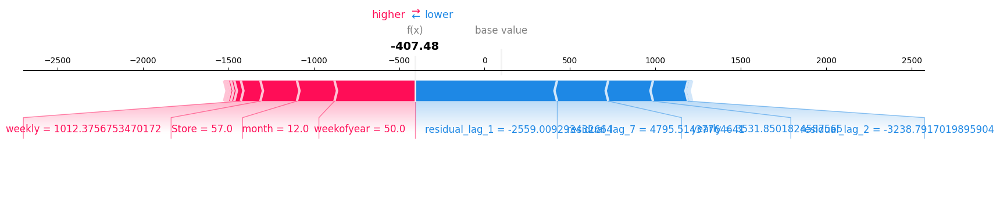

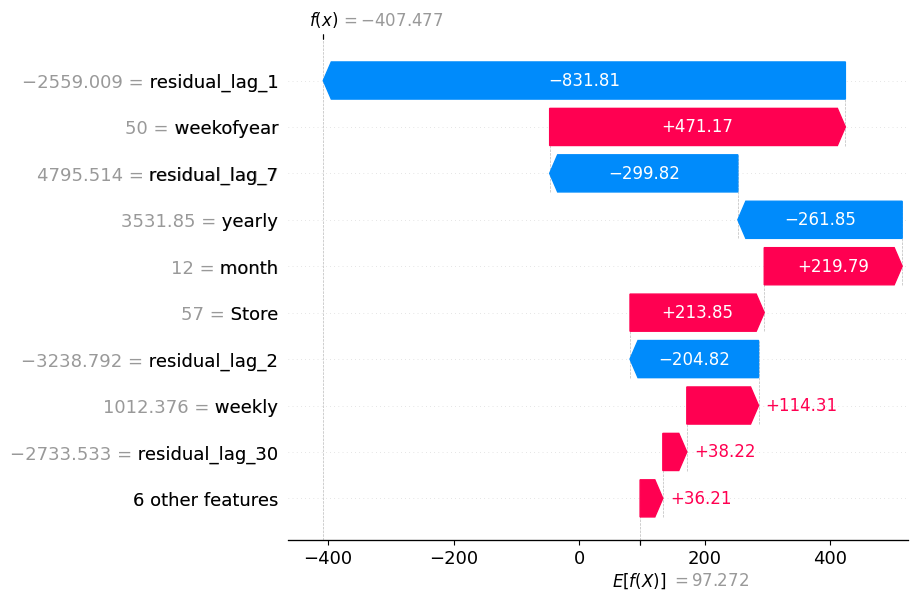

In [54]:
# Choix d'une instance aléatoire parmi l'échantillon
seed_value = 105 
random.seed(seed_value)
instance_index = random.randint(0, sample_size - 1)

print("Instance sélectionnée :", instance_index)
shap.initjs()

# Force plot : contributions locales
shap.force_plot(explainer.expected_value, shap_values.values[instance_index], X_sample.iloc[instance_index], matplotlib=True)


# Waterfall plot : top 10 features
shap.waterfall_plot(shap_values[instance_index], max_display=10)

## 4.3 Prophet X LGBM avec external features

avec données exogènes

In [55]:
# ------------------------------
# Application
# ------------------------------
df_exo = pd.read_pickle("df_exo.pkl")
store_id = selected_stores

df_store = df_exo[df_exo['Store'].isin(store_id)].copy()
print(df_store['Store'].unique())



[1115   71   85  102  105   10   57   50   49 1086]


In [56]:
horizon = 180
split_date = df_store['date'].max() - pd.Timedelta(days=horizon)
split_date

Timestamp('2015-02-01 00:00:00')

In [57]:
df_prophet = decompose_with_prophet(df_store, split_date, horizon)

Prophet decomposition:   0%|                                                                                                                                | 0/10 [00:00<?, ?it/s]17:47:43 - cmdstanpy - INFO - Chain [1] start processing
17:47:43 - cmdstanpy - INFO - Chain [1] done processing
Prophet decomposition:  10%|████████████                                                                                                            | 1/10 [00:00<00:03,  2.88it/s]17:47:43 - cmdstanpy - INFO - Chain [1] start processing
17:47:44 - cmdstanpy - INFO - Chain [1] done processing
Prophet decomposition:  20%|████████████████████████                                                                                                | 2/10 [00:00<00:02,  2.92it/s]17:47:44 - cmdstanpy - INFO - Chain [1] start processing
17:47:44 - cmdstanpy - INFO - Chain [1] done processing
Prophet decomposition:  30%|████████████████████████████████████                                                            

In [58]:
exog_cols = ['Open',
    'Promo',
    'Promo2',
    'SchoolHoliday',
    'CompetitionDistance',
    'CompetitionActive',
    'StateHoliday',
    'StoreType',
    'Assortment',
    'PromoInterval'
    ]

In [59]:
# Préparation du DataFrame de features exogènes
df_exo = df_exo[['Store', 'date'] + exog_cols].copy()
df_exo.rename(columns={'date': 'ds'}, inplace=True)

# Merge des DataFrames Prophet et variables exogenes
df_prophet_exo = pd.merge(df_prophet, df_exo, on=['ds', 'Store'], how='left')

# df_merged contient maintenant les résultats de la décomposition Prophet
# ainsi que les features exogènes.
print(df_prophet_exo.head())

          ds     y        trend       weekly      yearly         yhat  \
0 2013-01-01     0  4256.383196   573.831612 -449.091264  4381.123544   
1 2013-01-02  3697  4258.546831   351.230174 -515.460083  4094.316922   
2 2013-01-03  4297  4260.710466   180.731030 -570.795240  3870.646256   
3 2013-01-04  4540  4262.874101  1032.878958 -614.988310  4680.764749   
4 2013-01-05  4771  4265.037736  1481.490930 -648.120382  5098.408284   

      residual  Store  Open  Promo  Promo2  SchoolHoliday  \
0 -4381.123544   1115     0      0       1              1   
1  -397.316922   1115     1      0       1              1   
2   426.353744   1115     1      0       1              1   
3  -140.764749   1115     1      0       1              1   
4  -327.408284   1115     1      0       1              1   

   CompetitionDistance  CompetitionActive StateHoliday StoreType Assortment  \
0               5350.0                  0            a         d          c   
1               5350.0              

In [60]:
df_feat = create_features(df_prophet_exo)

In [61]:
df_feat.head()

,ds,y,trend,weekly,yearly,yhat,residual,Store,Open,Promo,Promo2,SchoolHoliday,CompetitionDistance,CompetitionActive,StateHoliday,StoreType,Assortment,PromoInterval,dayofweek,month,day,weekofyear,residual_lag_1,residual_lag_2,residual_lag_3,residual_lag_7,residual_lag_28,residual_lag_30,residual_lag_60
60,2013-03-02,6027,4386.201386,1481.490930,202.358245,6070.050560,-43.050560,1115,1,0,1,0,5350.0,0,0,d,c,"Mar,Jun,Sept,Dec",5,3,2,9,-527.496795,739.382158,-519.710769,8.333638,-364.362791,243.698999,-4381.123544
61,2013-03-03,0,4388.365024,-5070.221774,216.255934,-465.600816,465.600816,1115,0,0,1,0,5350.0,0,0,d,c,"Mar,Jun,Sept,Dec",6,3,3,9,-43.050560,-527.496795,739.382158,592.527617,775.336638,-740.133307,-397.316922
62,2013-03-04,7150,4390.528661,1450.059069,229.203402,6069.791131,1080.208869,1115,1,1,1,0,5350.0,0,0,d,c,"Mar,Jun,Sept,Dec",0,3,4,10,465.600816,-43.050560,-527.496795,-2359.273120,925.175720,-364.362791,426.353744
63,2013-03-05,6442,4392.692299,573.831612,241.150240,5207.674152,1234.325848,1115,1,1,1,0,5350.0,0,0,d,c,"Mar,Jun,Sept,Dec",1,3,5,10,1080.208869,465.600816,-43.050560,-854.368025,1258.190293,775.336638,-140.764749
64,2013-03-06,5654,4394.855937,351.230174,252.062598,4998.148709,655.851291,1115,1,1,1,0,5350.0,0,0,d,c,"Mar,Jun,Sept,Dec",2,3,6,10,1234.325848,1080.208869,465.600816,-519.710769,165.797474,925.175720,-327.408284


In [62]:
model = train_lgbm(df_feat, horizon)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2694
[LightGBM] [Info] Number of data points in the train set: 7020, number of used features: 24
[LightGBM] [Info] Start training from score 56.141029


In [63]:
df_forecast = predict_lgbm(df_feat, model, horizon)
df_forecast.head()

,Store,date,Sales,Sales_forecast
0,1115,2015-02-02,8090,8677.947332
1,1115,2015-02-03,7222,7002.161771
2,1115,2015-02-04,7066,6929.844834
3,1115,2015-02-05,6173,6726.614861
4,1115,2015-02-06,7400,7477.141567


In [64]:
with mlflow.start_run(run_name="LightGBM_X_Prophet_avec_ext"):
    # # 1. Entraînement du modèle
    # horizon = 180
    # model = train_lgbm(df_feat, horizon=horizon)

    # 2. Prédiction + évaluation par magasin
    features = ['trend', 'weekly', 'yearly', 'dayofweek', 'month', 'day', 'weekofyear', 'Store'] + \
               exog_cols + [col for col in df_feat.columns if 'residual_lag_' in col]

    maes = []
    rmses = []
    rmspes = []
    results = []

    for store_id in df_feat['Store'].unique():
        df_store = df_feat[df_feat['Store'] == store_id].copy()
        df_store.sort_values('ds', inplace=True)

        X_test = df_store[features].iloc[-horizon:]
        y_true = df_store['y'].iloc[-horizon:].values

        y_pred = model.predict(X_test)
        final_pred = (
            y_pred
            + df_store.iloc[-horizon:]['trend'].values
            + df_store.iloc[-horizon:]['weekly'].values
            + df_store.iloc[-horizon:]['yearly'].values
        )

        rmse_val = rmse(y_true, final_pred)
        rmspe_val = rmspe(y_true, final_pred)
        mae_val = mae(y_true, final_pred)

        maes.append(mae_val)
        rmses.append(rmse_val)
        rmspes.append(rmspe_val)

        # Sauvegarde des résultats
        results.append(pd.DataFrame({
            'Store': store_id,
            'date': df_store.iloc[-horizon:]['ds'].values,
            # 'True_Sales': y_true,
            'Sales_forecast': final_pred
        }))
        

    # 3. Log des métriques moyennes
    print("Évaluation Prophet X LGBM :")
    print(f"RMSE  : {np.mean(rmses):,.2f}")
    print(f"RMSPE : {np.mean(rmspes):,.4f}")
    print(f"MAE   : {np.mean(maes):,.2f}")


    
    mlflow.log_metric("MAE", round(np.mean(maes),2))
    mlflow.log_metric("RMSE", round(np.mean(rmses),2))
    mlflow.log_metric("RMSPE", round(np.mean(rmspes),2))

    # 4. Log du fichier de prédiction
    df_preds = pd.concat(results, ignore_index=True)
    pred_path = "prévisions/lgbm_exog_preds.csv"
    df_preds.to_csv(pred_path, index=False)
    mlflow.log_artifact(pred_path)

    # 5. Paramètres du run
    mlflow.log_param("model_type", "lightgbm_with_decomposition")
    mlflow.log_param("n_stores", df_feat['Store'].nunique())
    mlflow.log_param("horizon", horizon)


Évaluation Prophet X LGBM :
RMSE  : 2,700.82
RMSPE : 0.4274
MAE   : 2,065.03


In [65]:
# Concaténation de l'historique

# Préparer le DataFrame historique pour concaténation
df_hist = df_feat.copy()
df_hist = df_hist[['Store', 'ds', 'y']].copy()
df_hist.rename(columns={'ds': 'date', 'y': 'Sales'}, inplace=True)
df_hist = df_hist[~df_hist['date'].isin(df_forecast['date'])]  # éviter les doublons

# Fusion
df_combined = pd.concat([df_hist, df_forecast], ignore_index=True)

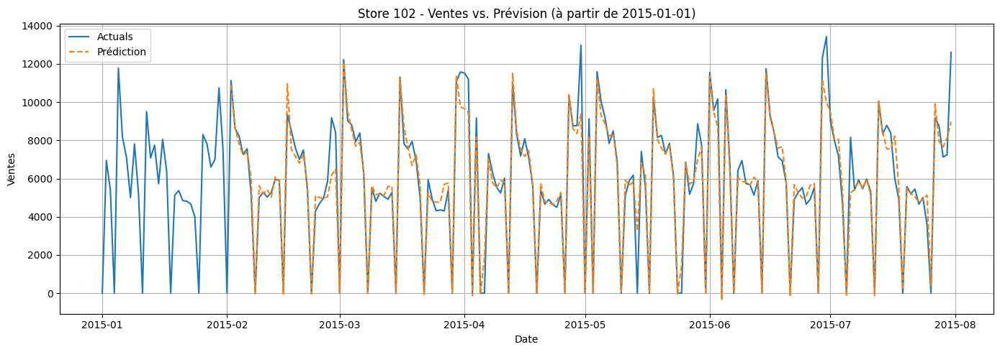

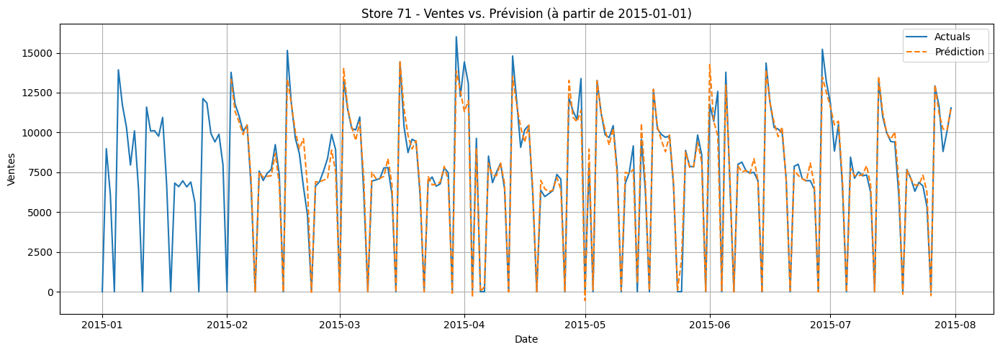

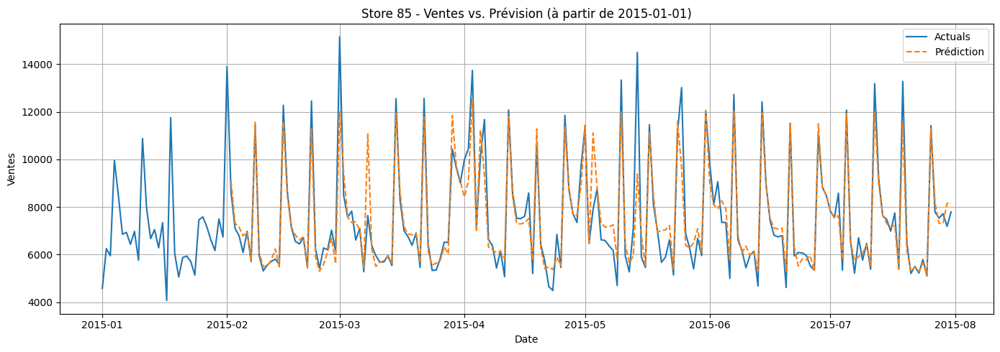

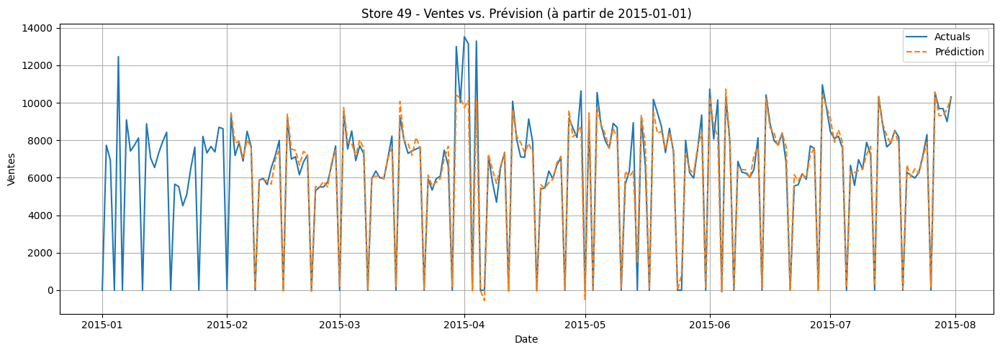

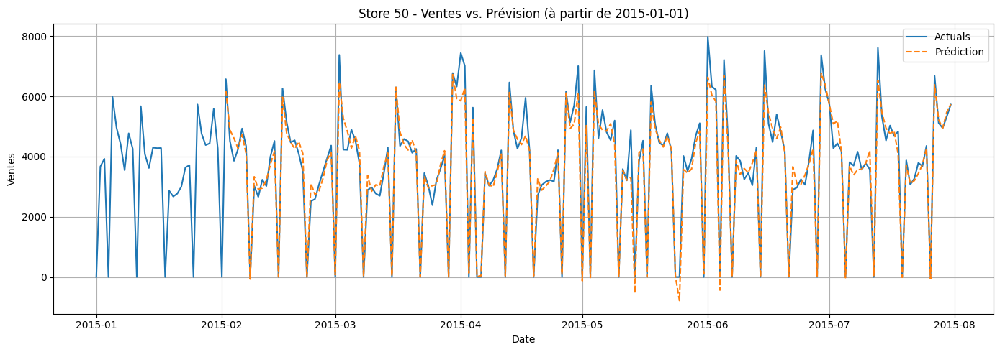

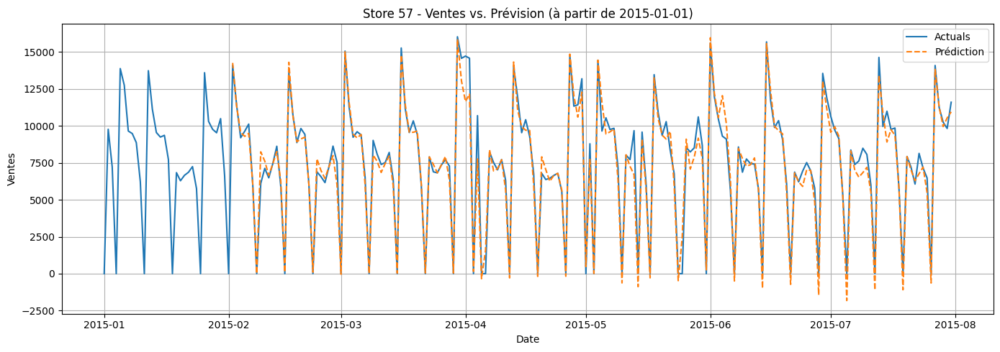

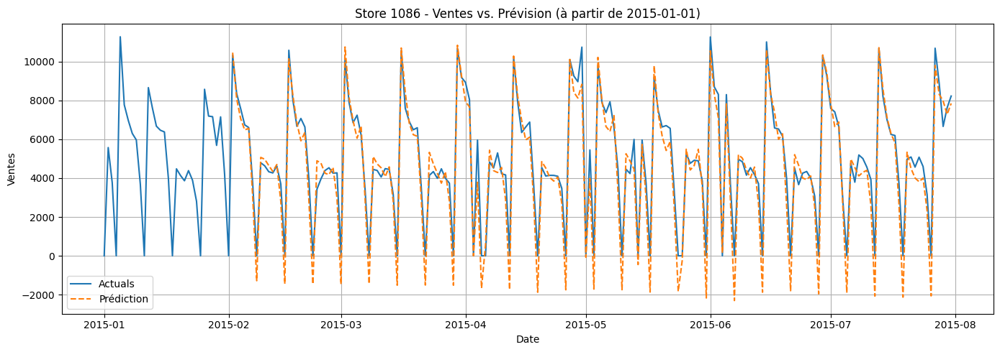

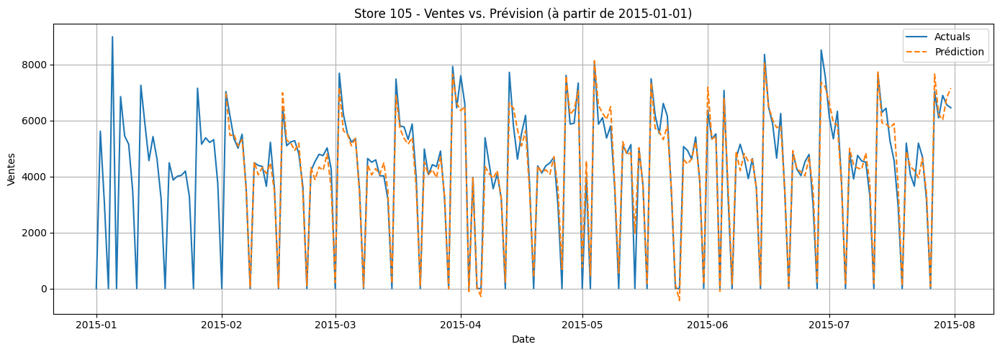

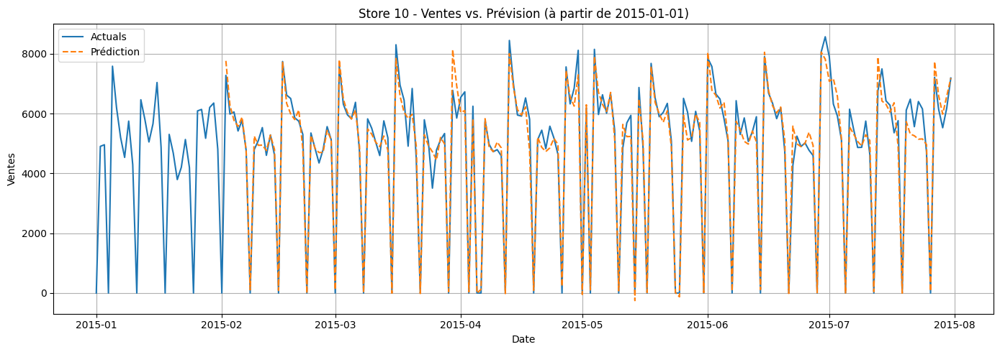

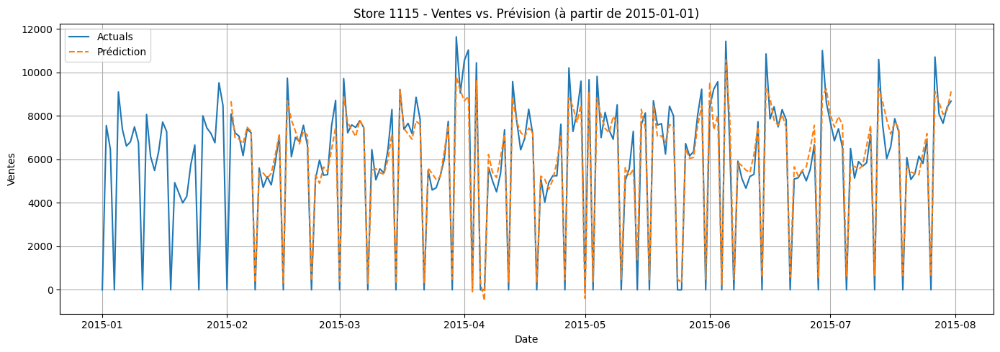

In [66]:
plot_forecasts(df_combined, store_ids=selected_stores, start_date='2015-01-01')

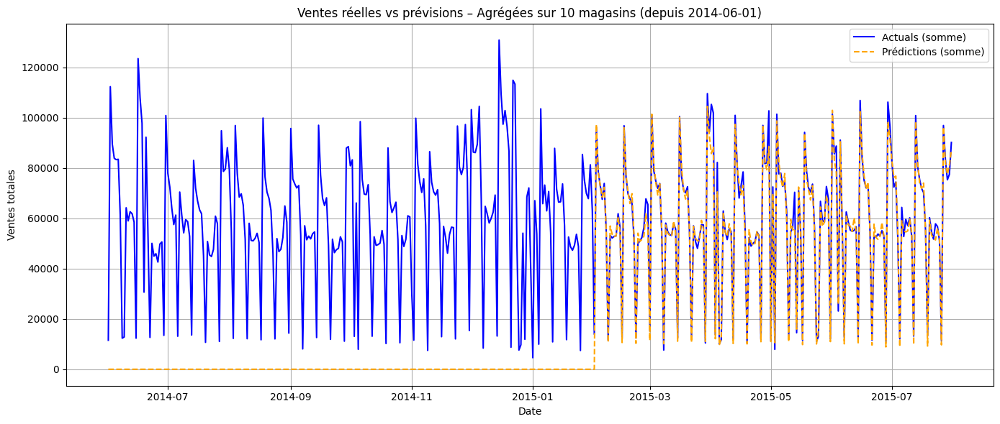

In [67]:
plot_aggregated_forecast(df_combined, store_ids=selected_stores, start_date='2014-06-01')

Explication globale

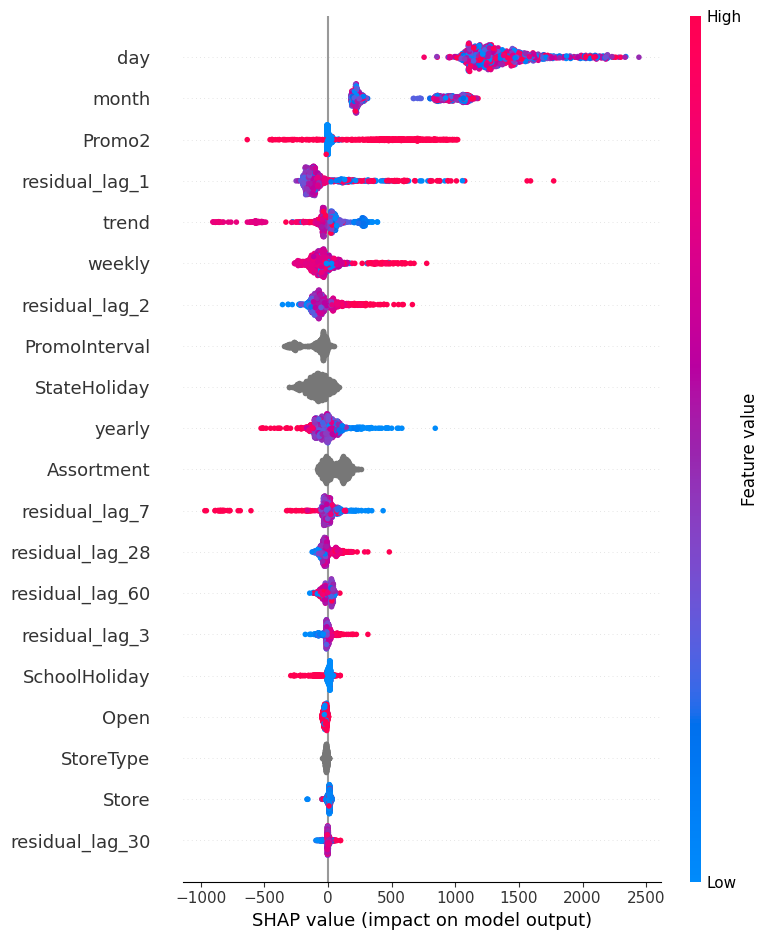

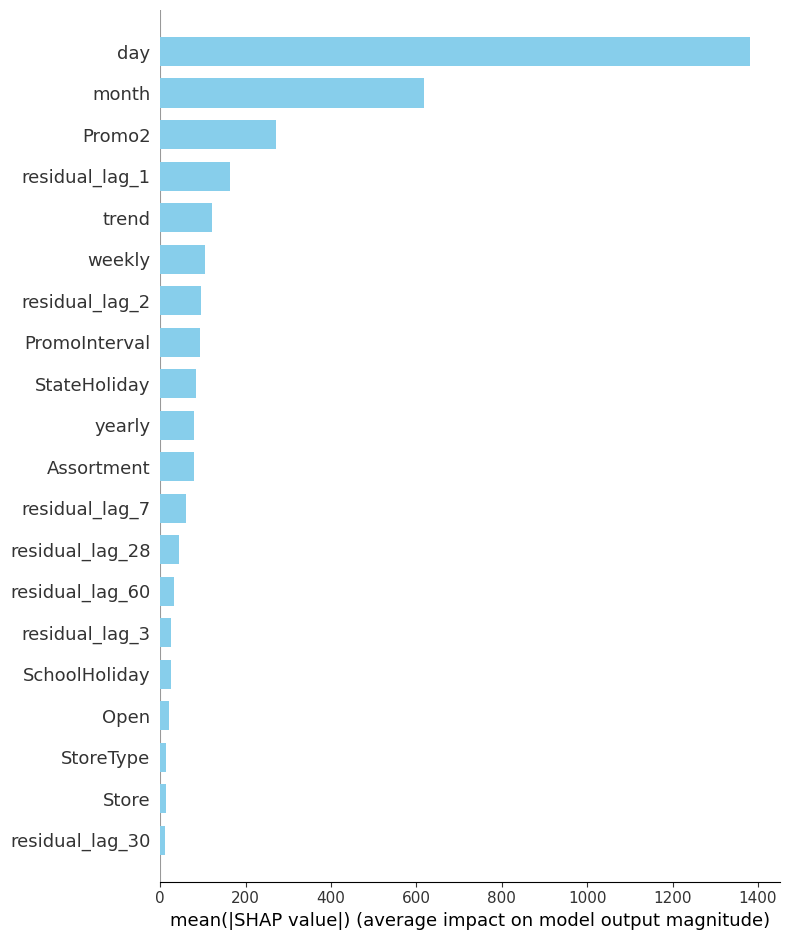

In [68]:
# 1. Préparation des données (mêmes features que celles utilisées pour l'entraînement)
features = ['trend', 'weekly', 'yearly', 'dayofweek', 'month', 'day', 'weekofyear', 'Store'] + \
            exog_cols + \
            [col for col in df_feat.columns if 'residual_lag_' in col]

X = df_feat[features]
y = df_feat['residual']

# Optionnel : échantillonnage pour accélérer SHAP
sample_size = 1000
X_sample = X.sample(n=sample_size, random_state=42)

# 2. Création de l'explainer SHAP
explainer = shap.Explainer(model)  # model = LGBMRegressor
shap_values = explainer(X_sample)

# 3. Résumé global
shap.summary_plot(shap_values, X_sample, feature_names=features)
shap.summary_plot(shap_values, X_sample, feature_names=features, plot_type="bar", color="skyblue")


Explication locale:

Instance sélectionnée : 357


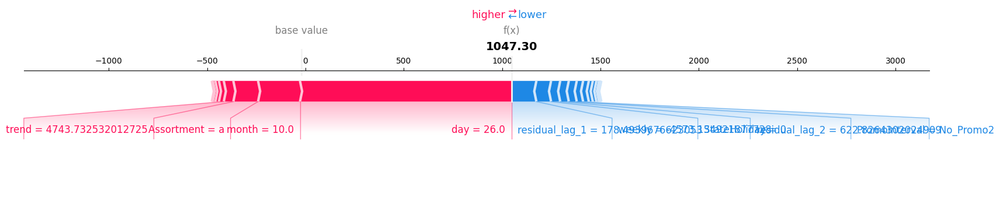

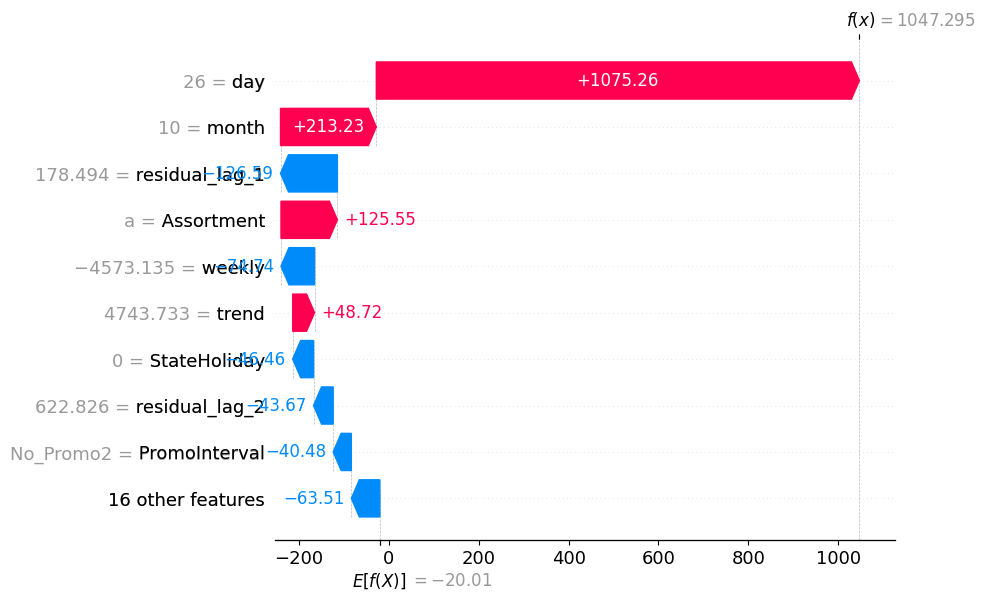

In [69]:
# Choix d'une instance aléatoire parmi l'échantillon
instance_index = random.randint(0, sample_size - 1)

print("Instance sélectionnée :", instance_index)
shap.initjs()

# Force plot : contributions locales
shap.force_plot(explainer.expected_value, shap_values.values[instance_index], X_sample.iloc[instance_index], matplotlib=True)


# Waterfall plot : top 10 features
shap.waterfall_plot(shap_values[instance_index], max_display=10)

On voit donc que l'apport des données exogènes n'est pas évident, ici cela dégrade même la performance gobale du modèle en rajoutant des information que le modèle avait finalement déjà capturé dans les saisonnalité/trend du modèle sans variables exogènes. On recommande donc dans ce cas précis l'utilisation de LGBMxProphet SANS external features.

# 3. ETS Former

Le modèle ETSformer combine la modélisation interprétable des séries temporelles via les composantes de lissage exponentiel (niveau, tendance, saisonnalité) avec la capacité d'apprentissage de dépendances complexes et à long terme entre les séries temporelles des différents magasins grâce à l'architecture Transformer.

Il traite chaque série temporelle de ventes de magasin comme une séquence et utilise le Transformer pour capturer les interdépendances temporelles et potentielles inter-magasins. La prédiction de chaque série repose sur une décomposition de type ETS (Error, Trend, Seasonality), assurant l'accessibilité et l'interprétabilité des composantes fondamentales.

Sélection des magasins (10 pour commencer)

In [70]:
# store_id = [1115, 1086, 71]
# df = pd.read_csv('./Data/df_simple.csv')
# df_store = df[df['Store'].isin(store_id)].copy()

# df_pivot = df_store.pivot_table(index='date', columns='Store', values='Sales')
# df_pivot.columns = [f'Sales_{col}' for col in df_pivot.columns]

# # Réinitialiser l'index pour avoir 'date' comme une colonne
# df_pivot = df_pivot.reset_index()

# print(df_pivot.head())


# df_pivot.to_csv('./Data/df_store3.csv', index=False)

embeddings des stores (FInalement PAS utilisé)

In [71]:
# import torch
# import torch.nn as nn

# # 1. Charger les données
# df = pd.read_csv('./Data/df_features.csv')

# # 2. Paramètres
# num_stores = df['Store'].nunique()
# embedding_dim = 8

# # 3. Créer la couche d'embedding
# store_embedding_layer = nn.Embedding(num_embeddings=num_stores, embedding_dim=embedding_dim)

# # 4. Map Store ID → Index
# store_id_to_idx = {store_id: idx for idx, store_id in enumerate(sorted(df['Store'].unique()))}

# # 5. Transformer Store en indices pour nn.Embedding
# store_indices = df['Store'].map(store_id_to_idx).values
# store_indices_tensor = torch.LongTensor(store_indices)

# # 6. Générer les embeddings
# store_embeddings = store_embedding_layer(store_indices_tensor)  # (nb_samples, embedding_dim)

# # 7. Ajouter les embeddings au DataFrame
# # Transformer le tensor en numpy array
# store_embeddings_np = store_embeddings.detach().numpy()

# # Créer des colonnes pour les embeddings
# embedding_cols = [f'embedding_{i}' for i in range(embedding_dim)]
# df_embeddings = pd.DataFrame(store_embeddings_np, columns=embedding_cols)

# # 8. Concaténer au DataFrame initial
# df_final = pd.concat([df.reset_index(drop=True), df_embeddings.reset_index(drop=True)], axis=1)

# # 9. Résultat
# print(df_final.columns)

# print(df_final.head())

# df_store = df_final[df_final['Store'].isin(store_id)].copy()
# df_store.to_csv('./Data/df_features3.csv', index=False)

Mise en forme de la liste des magasins pour le modèle: 

In [72]:
store_id = selected_stores
df = pd.read_csv('./Data/df_simple.csv')
df_store = df[df['Store'].isin(store_id)].copy()

df_pivot = df_store.pivot_table(index='date', columns='Store', values='Sales')
df_pivot.columns = [f'Sales_{col}' for col in df_pivot.columns]

# Réinitialiser l'index pour avoir 'date' comme une colonne
df_pivot = df_pivot.reset_index()

print(df_pivot.head())


df_pivot.to_csv('./Data/df_selected_stores.csv', index=False)

df_check = pd.read_csv('./Data/df_selected_stores.csv')
print(df_check.columns.tolist())

         date  Sales_10  Sales_49  Sales_50  Sales_57  Sales_71  Sales_85  \
0  2013-01-01       0.0       0.0       0.0       0.0       0.0    4220.0   
1  2013-01-02    4812.0    5866.0    3804.0   10719.0    7041.0    6069.0   
2  2013-01-03    4675.0    4622.0    3388.0    9988.0    7246.0    5246.0   
3  2013-01-04    5114.0    5250.0    3764.0   10222.0    7737.0    5339.0   
4  2013-01-05    4256.0    5937.0    4380.0    8112.0    7263.0    5774.0   

   Sales_102  Sales_105  Sales_1086  Sales_1115  
0        0.0        0.0         0.0         0.0  
1     6676.0     2326.0      9308.0      3697.0  
2     5714.0     1811.0      9210.0      4297.0  
3     6174.0     2005.0      8489.0      4540.0  
4     7024.0     1465.0      6024.0      4771.0  
['date', 'Sales_10', 'Sales_49', 'Sales_50', 'Sales_57', 'Sales_71', 'Sales_85', 'Sales_102', 'Sales_105', 'Sales_1086', 'Sales_1115']


In [73]:
df = pd.read_csv('./Data/df_selected_stores.csv')
df.head()

,date,Sales_10,Sales_49,Sales_50,Sales_57,Sales_71,Sales_85,Sales_102,Sales_105,Sales_1086,Sales_1115
0,2013-01-01,0.0,0.0,0.0,0.0,0.0,4220.0,0.0,0.0,0.0,0.0
1,2013-01-02,4812.0,5866.0,3804.0,10719.0,7041.0,6069.0,6676.0,2326.0,9308.0,3697.0
2,2013-01-03,4675.0,4622.0,3388.0,9988.0,7246.0,5246.0,5714.0,1811.0,9210.0,4297.0
3,2013-01-04,5114.0,5250.0,3764.0,10222.0,7737.0,5339.0,6174.0,2005.0,8489.0,4540.0
4,2013-01-05,4256.0,5937.0,4380.0,8112.0,7263.0,5774.0,7024.0,1465.0,6024.0,4771.0


**Définition des arguments**

Au lieu de laisser argparse gérer les arguments depuis la ligne de commande, on va créer un objet argparse.Namespace et y définir les différents paramètres dont Exp_Main a besoin.

In [74]:
class Args:
    def __init__(self):
        # basic config
        self.model_id = 'rossmann_sales_multi'
        self.model = 'ETSformer'

        # data loader
        self.data = 'custom' # 'custom' Ou 'Rossman' class spécifique pour notre challenge
        self.root_path = './Data/'
        self.data_path = 'df_selected_stores.csv'
        self.features = 'M'  # S = une seule variable pour prédire elle-même, MS = plusieurs variables pour prédire la même variable, M = plusieurs variables pour prédire plusieurs variables
        self.target = [col for col in df_pivot.columns if col.startswith('Sales_')]
        self.freq = 'd'  # Fréquence des données (journalière), ('M'= Monthly)
        self.timeenc = 1
        self.checkpoints = './checkpoints/'

        # forecasting task
        self.seq_len = 180  # Longueur de la séquence d'entrée (jours)
        self.label_len = 0
        self.pred_len = 60  # Longueur de la prédiction (jours)

        # model define
        self.enc_in = 0  # Déterminé dynamiquement juste après. = nombre_de_magasins (le nombre de séries d'entrée)
        self.dec_in = 0  # Déterminé dynamiquement juste après = nombre_de_magasins (le nombre de séries à décoder)
        self.c_out = 0  # Déterminé dynamiquement juste après = nombre_de_magasins (le nombre de séries à prédire)
        self.d_model = 512
        self.n_heads = 8
        self.e_layers = 2
        self.d_layers = 2
        self.d_ff = 2048
        self.K = 4  # Bases de Fourier
        self.dropout = 0.2
        self.embed = 'timeF'
        self.activation = 'gelu'

        self.min_lr = 1e-30
        self.warmup_epochs = 3
        self.std = 0.2
        self.smoothing_learning_rate = 0
        self.damping_learning_rate = 0
        self.output_attention = False

        # optimization
        self.optim = 'adam'
        self.num_workers = 0  # à ajuster pour le notebook
        self.itr = 1
        self.train_epochs = 30  # Nombre d'époques
        self.batch_size = 32
        self.patience = 5
        self.learning_rate = 1e-5
        self.des = 'RossmannSalesExp'
        self.lradj = 'exponential_with_warmup'

        # GPU
        self.use_gpu = torch.cuda.is_available()
        self.gpu = 0
        self.use_multi_gpu = False
        self.devices = '0'
        self.device_ids = [0] if torch.cuda.is_available() else []

args = Args()

if args.use_gpu and args.use_multi_gpu:
    args.devices = args.devices.replace(' ', '')
    device_ids = args.devices.split(',')
    args.device_ids = [int(id_) for id_ in device_ids]
    args.gpu = args.device_ids[0]

print(f"TARGETS ={args.target}")

# Détermination dynamique de enc_in et dec_in
try:
    input_features = [col for col in df_pivot.columns if col not in [args.target, 'date']] # Exclude 'date'
    args.enc_in = len(input_features)
    args.dec_in = len(input_features)
    args.c_out = len(input_features)
    print(f"Nombre de features d'entrée (enc_in/dec_in): {args.enc_in}")
except FileNotFoundError:
    print(f"Erreur: Le fichier {args.root_path + args.data_path} n'a pas été trouvé.")
except ImportError:
    print("Pandas n'est pas installé. Veuillez l'installer.")


# Afficher les arguments pour vérification
print(args.__dict__)


TARGETS =['Sales_10', 'Sales_49', 'Sales_50', 'Sales_57', 'Sales_71', 'Sales_85', 'Sales_102', 'Sales_105', 'Sales_1086', 'Sales_1115']
Nombre de features d'entrée (enc_in/dec_in): 10
{'model_id': 'rossmann_sales_multi', 'model': 'ETSformer', 'data': 'custom', 'root_path': './Data/', 'data_path': 'df_selected_stores.csv', 'features': 'M', 'target': ['Sales_10', 'Sales_49', 'Sales_50', 'Sales_57', 'Sales_71', 'Sales_85', 'Sales_102', 'Sales_105', 'Sales_1086', 'Sales_1115'], 'freq': 'd', 'timeenc': 1, 'checkpoints': './checkpoints/', 'seq_len': 180, 'label_len': 0, 'pred_len': 60, 'enc_in': 10, 'dec_in': 10, 'c_out': 10, 'd_model': 512, 'n_heads': 8, 'e_layers': 2, 'd_layers': 2, 'd_ff': 2048, 'K': 4, 'dropout': 0.2, 'embed': 'timeF', 'activation': 'gelu', 'min_lr': 1e-30, 'warmup_epochs': 3, 'std': 0.2, 'smoothing_learning_rate': 0, 'damping_learning_rate': 0, 'output_attention': False, 'optim': 'adam', 'num_workers': 0, 'itr': 1, 'train_epochs': 30, 'batch_size': 32, 'patience': 5, 'l

Initialisation de Exp_Main et entraînement

On va ici instancier la classe Exp_Main avec l'objet args créé juste avant, puis appeler sa méthode train. 
On va définir la graine aléatoire ici.

In [75]:
def set_seed(seed):
    random.seed(seed)
    seed += 1
    np.random.seed(seed)
    seed += 1
    torch.manual_seed(seed)

set_seed(0) # Définir une graine pour la reproductibilité

Exp = Exp_Main
exp = Exp(args)

setting = '{}_{}_{}_ft{}_sl{}_pl{}_dm{}_nh{}_el{}_dl{}_df{}_K{}_lr{}_{}_{}'.format(
    args.model_id,
    args.model,
    args.data,
    args.features,
    args.seq_len,
    args.pred_len,
    args.d_model,
    args.n_heads,
    args.e_layers,
    args.d_layers,
    args.d_ff,
    args.K,
    args.learning_rate,
    args.des, 0)



Use CPU


In [76]:
print('>>>>>>>start training : {}>>>>>>>>>>>>>>>>>>>>>>>>>>'.format(setting))
exp.train(setting)

>>>>>>>start training : rossmann_sales_multi_ETSformer_custom_ftM_sl180_pl60_dm512_nh8_el2_dl2_df2048_K4_lr1e-05_RossmannSalesExp_0>>>>>>>>>>>>>>>>>>>>>>>>>>
[]
Data statistics before scaling:
         Sales_10      Sales_49     Sales_50      Sales_57      Sales_71  \
count   942.00000    942.000000   942.000000    942.000000    942.000000   
mean   4634.43949   6024.730361  3519.616773   8657.784501   7493.200637   
std    2291.82108   3228.559791  1935.992563   5289.638201   4156.760336   
min       0.00000      0.000000     0.000000      0.000000      0.000000   
25%    4417.00000   5332.000000  2826.000000   6643.500000   6356.500000   
50%    5089.00000   6634.000000  3855.000000   9023.500000   7567.000000   
75%    5950.25000   7834.750000  4643.000000  11544.750000  10187.750000   
max    9534.00000  17743.000000  9205.000000  38037.000000  20126.000000   

           Sales_85     Sales_102     Sales_105    Sales_1086    Sales_1115  
count    942.000000    942.000000    942.000

ETSformer(
  (enc_embedding): ETSEmbedding(
    (conv): Conv1d(10, 512, kernel_size=(3,), stride=(1,), padding=(2,), bias=False)
    (dropout): Dropout(p=0.2, inplace=False)
  )
  (encoder): Encoder(
    (layers): ModuleList(
      (0-1): 2 x EncoderLayer(
        (growth_layer): GrowthLayer(
          (in_proj): Linear(in_features=512, out_features=512, bias=True)
          (es): ExponentialSmoothing(
            (dropout): Dropout(p=0.2, inplace=False)
          )
          (out_proj): Linear(in_features=512, out_features=512, bias=True)
        )
        (seasonal_layer): FourierLayer()
        (level_layer): LevelLayer(
          (es): ExponentialSmoothing(
            (dropout): Dropout(p=0.2, inplace=False)
            (aux_dropout): Dropout(p=0.2, inplace=False)
          )
          (growth_pred): Linear(in_features=512, out_features=10, bias=True)
          (season_pred): Linear(in_features=512, out_features=10, bias=True)
        )
        (ff): Feedforward(
          (linear

Étape 4 : Évaluation

Après l'entraînement, on va évaluer le modèle sur les ensembles de validation et de test en appelant la méthode test de l'objet exp.

In [77]:
print('>>>>>>>testing on validation set : {}<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<'.format(setting))
val_rmse, val_rmspe, val_mae = exp.test(setting=setting, data='val', save_vals=True)
print(f"Validation RMSE: {val_rmse}, RMSPE: {val_rmspe}, MAE: {val_mae}")

print('>>>>>>>testing on test set : {}<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<'.format(setting))
test_rmse, test_rmspe, test_mae = exp.test(setting=setting, data='test', save_vals=True)
print(f"Test RMSE: {test_rmse}, RMSPE: {test_rmspe}, MAE: {test_mae}")

>>>>>>>testing on validation set : rossmann_sales_multi_ETSformer_custom_ftM_sl180_pl60_dm512_nh8_el2_dl2_df2048_K4_lr1e-05_RossmannSalesExp_0<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
[]
Data statistics before scaling:
         Sales_10      Sales_49     Sales_50      Sales_57      Sales_71  \
count   942.00000    942.000000   942.000000    942.000000    942.000000   
mean   4634.43949   6024.730361  3519.616773   8657.784501   7493.200637   
std    2291.82108   3228.559791  1935.992563   5289.638201   4156.760336   
min       0.00000      0.000000     0.000000      0.000000      0.000000   
25%    4417.00000   5332.000000  2826.000000   6643.500000   6356.500000   
50%    5089.00000   6634.000000  3855.000000   9023.500000   7567.000000   
75%    5950.25000   7834.750000  4643.000000  11544.750000  10187.750000   
max    9534.00000  17743.000000  9205.000000  38037.000000  20126.000000   

           Sales_85     Sales_102     Sales_105    Sales_1086    Sales_1115  
count    942.000000    942

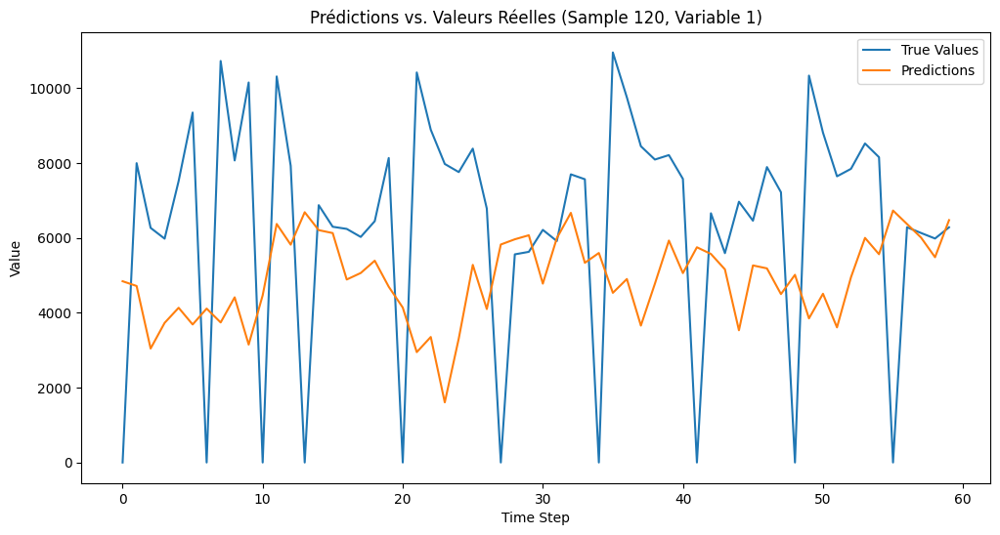

In [78]:
#  chargement et visualisation des prédictions
predictions_path = os.path.join('./results', setting, 'pred.npy')
true_path = os.path.join('./results', setting, 'true.npy')

if os.path.exists(predictions_path) and os.path.exists(true_path):
    predictions = np.load(predictions_path)
    true_values = np.load(true_path)

    # Choisir un exemple et une variable à visualiser (si les données sont multivariées)
    sample_index = 120
    variable_index = 1

    plt.figure(figsize=(12, 6))
    plt.plot(true_values[sample_index, :, variable_index], label='True Values')
    plt.plot(predictions[sample_index, :, variable_index], label='Predictions')
    plt.title(f'Prédictions vs. Valeurs Réelles (Sample {sample_index}, Variable {variable_index})')
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.legend()
    plt.show()
else:
    print("Les fichiers de prédictions ou de valeurs réelles n'ont pas été trouvés.")

In [79]:
# Importation de time_features
from utils.timefeatures import time_features

# Importer ETSformerModel
from models.etsformer.model import ETSformer  # Utilisation d'un import absolu


In [80]:
split_date = pd.to_datetime('2015-06-01')
forecast_horizon = args.pred_len

In [81]:
with mlflow.start_run(run_name="ETSformer_M_no_ext"):
    # 1. Split
    df_train, df_test = prepare_train_test_by_store(df_simple, split_date, selected_stores)

    # 2. Pivot des données (multi-stores)
    df_train_pivot = df_train.pivot_table(index='date', columns='Store', values='Sales')
    df_test_pivot = df_test.pivot_table(index='date', columns='Store', values='Sales')

    print(df_test_pivot.head())

    # 3. Préparer les inputs pour ETSformer
    df_train_pivot = df_train_pivot.sort_index()
    X_hist = df_train_pivot.tail(180).values  # shape [180, n_stores]

    # 4. Features temporelles sur les dates
    dates_hist = df_train_pivot.tail(180).index
    S = time_features(dates_hist, freq='D').transpose(1, 0)  # shape [180, time_feat_dim]

    # 5. Torch tensors
    X_hist = torch.tensor(X_hist, dtype=torch.float32).unsqueeze(0)  # [batch=1, time, n_stores]
    S = torch.tensor(S, dtype=torch.float32).unsqueeze(0)            # [batch=1, time, time_feat_dim]
    
    # Préparer x_dec (zéros) et x_mark_dec (features temporelles)
    x_dec = torch.zeros((1, forecast_horizon, len(selected_stores)), dtype=torch.float32)
    
    dates_forecast = pd.date_range(start=split_date, periods=forecast_horizon)
    S_forecast = time_features(dates_forecast, freq='D').transpose(1, 0)  # shape [time, features]
    x_mark_dec = torch.tensor(S_forecast, dtype=torch.float32).unsqueeze(0)  # [batch=1, horizon, time_feat_dim]


    # 6. Charger modèle ETSformer
    model = ETSformer(args)
    path = os.path.join(args.checkpoints, setting)
    checkpoint_path = os.path.join(path, 'checkpoint.pth')
    model.load_state_dict(torch.load(checkpoint_path, map_location='cpu'))
    #mettre le modele en mode evaluation
    model.eval()

    # 7. Faire la prédiction
    # with torch.no_grad():
    #     output = model(X_hist, S)  # output shape [batch=1, horizon, n_stores]
    #     preds = output.squeeze(0).numpy()  # [horizon, n_stores]

    with torch.no_grad():
        output = model(X_hist, S, x_dec, x_mark_dec)
        preds = output.squeeze(0).numpy()
    
    # 8. Organiser les résultats
    forecast_dates = pd.date_range(start=split_date, periods=forecast_horizon)
    df_preds = pd.DataFrame(preds, columns=[f'Sales_{store}' for store in selected_stores])
    df_preds['date'] = forecast_dates
    df_preds = df_preds.melt(id_vars='date', var_name='Store', value_name='Sales_forecast')
    df_preds['Store'] = df_preds['Store'].apply(lambda x: int(x.replace('Sales_', '')))
  
    # 9. Fusionner avec le vrai test
    df_test_real = df_test[['Store', 'date', 'Sales']]
    df_test_eval = df_test_real.merge(df_preds, on=['Store', 'date'], how='left')

    # 10. Évaluation
    y_true = df_test_eval['Sales']
    y_pred = df_test_eval['Sales_forecast']

    rmse_val = rmse(y_true, y_pred)
    rmspe_val = rmspe(y_true, y_pred)
    mae_val = mae(y_true, y_pred)

    print("Évaluation ETSformer :")
    print(f"RMSE  : {rmse_val:,.2f}")
    print(f"RMSPE : {rmspe_val:,.4f}")
    print(f"MAE   : {mae_val:,.2f}")

    # 11. Log des métriques
    mlflow.log_metric("RMSE", round(rmse_val, 2))
    mlflow.log_metric("RMSPE", rmspe_val)
    mlflow.log_metric("MAE", mae_val)

    # 12. Log du modèle
    df_test_eval[['Store', 'date', 'Sales_forecast']].to_csv("prévisions/etsformer_predictions.csv", index=False)
    mlflow.log_artifact("etsformer_predictions.csv")

    # 13. Paramètres de l'expérience
    mlflow.log_param("model_type", "etsformer")
    mlflow.log_param("n_stores", len(selected_stores))
    mlflow.log_param("split_date", split_date.strftime("%Y-%m-%d"))
    mlflow.log_param("forecast_horizon", forecast_horizon)
    mlflow.log_param("input_history_days", 180)

Magasins sélectionnés: [np.int64(10), np.int64(49), np.int64(50), np.int64(57), np.int64(71), np.int64(85), np.int64(102), np.int64(105), np.int64(1086), np.int64(1115)]
Taille train: (8810, 3), test: (610, 3)
Store         10       49      50       57       71      85       102   \
date                                                                     
2015-06-01  7846.0  10729.0  7980.0  15590.0  11760.0  9860.0  11555.0   
2015-06-02  7572.0   8071.0  6327.0  11971.0  10701.0  8099.0   9565.0   
2015-06-03  6648.0  10154.0  6217.0  10460.0  12573.0  9065.0  10162.0   
2015-06-04  6486.0      0.0     0.0   9301.0      0.0  7352.0      0.0   
2015-06-05  5828.0  10316.0  7213.0   9099.0  13785.0  7349.0  10646.0   

Store         105      1086     1115  
date                                  
2015-06-01  6365.0  11267.0   8409.0  
2015-06-02  5337.0   8692.0   9232.0  
2015-06-03  5523.0   8311.0   9571.0  
2015-06-04     0.0      0.0      0.0  
2015-06-05  7074.0   8299.0  11435.0 

In [82]:
df_train_pivot = df_train.pivot_table(index='date', columns='Store', values='Sales')
df_train_pivot.head()

Store,10,49,50,57,71,85,102,105,1086,1115
date,,,,,,,,,,
2013-01-01,0.0,0.0,0.0,0.0,0.0,4220.0,0.0,0.0,0.0,0.0
2013-01-02,4812.0,5866.0,3804.0,10719.0,7041.0,6069.0,6676.0,2326.0,9308.0,3697.0
2013-01-03,4675.0,4622.0,3388.0,9988.0,7246.0,5246.0,5714.0,1811.0,9210.0,4297.0
2013-01-04,5114.0,5250.0,3764.0,10222.0,7737.0,5339.0,6174.0,2005.0,8489.0,4540.0
2013-01-05,4256.0,5937.0,4380.0,8112.0,7263.0,5774.0,7024.0,1465.0,6024.0,4771.0


In [83]:
df_test_pivot.head()

Store,10,49,50,57,71,85,102,105,1086,1115
date,,,,,,,,,,
2015-06-01,7846.0,10729.0,7980.0,15590.0,11760.0,9860.0,11555.0,6365.0,11267.0,8409.0
2015-06-02,7572.0,8071.0,6327.0,11971.0,10701.0,8099.0,9565.0,5337.0,8692.0,9232.0
2015-06-03,6648.0,10154.0,6217.0,10460.0,12573.0,9065.0,10162.0,5523.0,8311.0,9571.0
2015-06-04,6486.0,0.0,0.0,9301.0,0.0,7352.0,0.0,0.0,0.0,0.0
2015-06-05,5828.0,10316.0,7213.0,9099.0,13785.0,7349.0,10646.0,7074.0,8299.0,11435.0


In [84]:
df_test_eval.head()

,Store,date,Sales,Sales_forecast
0,85,2015-06-01,9860,1271.223633
1,71,2015-06-01,11760,3397.539062
2,102,2015-06-01,11555,5506.102539
3,105,2015-06-01,6365,4877.239746
4,10,2015-06-01,7846,6165.853516


In [85]:
print("selected_stores:", selected_stores)
print("df_preds.columns:", df_preds.columns)

selected_stores: [ 102   71   85   49   50   57 1086  105   10 1115]
df_preds.columns: Index(['date', 'Store', 'Sales_forecast'], dtype='object')


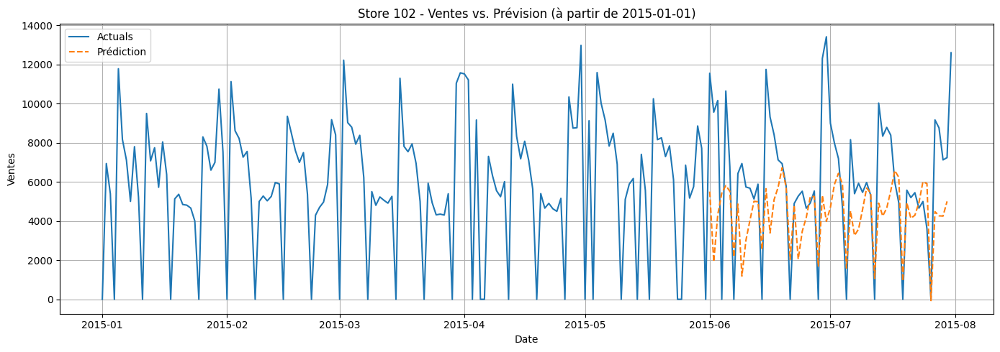

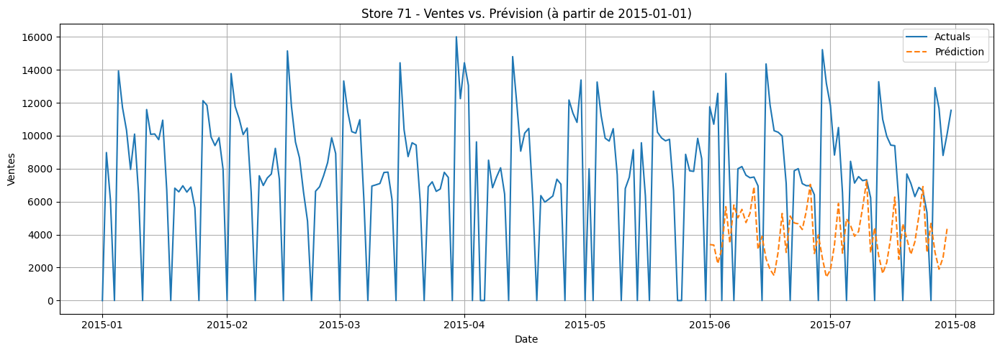

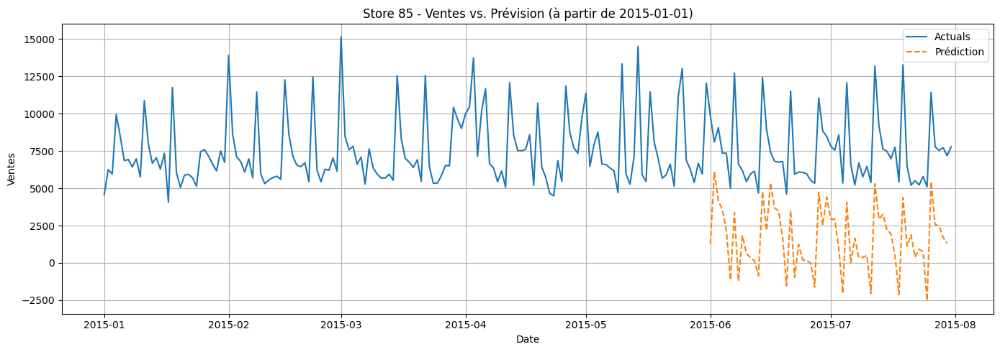

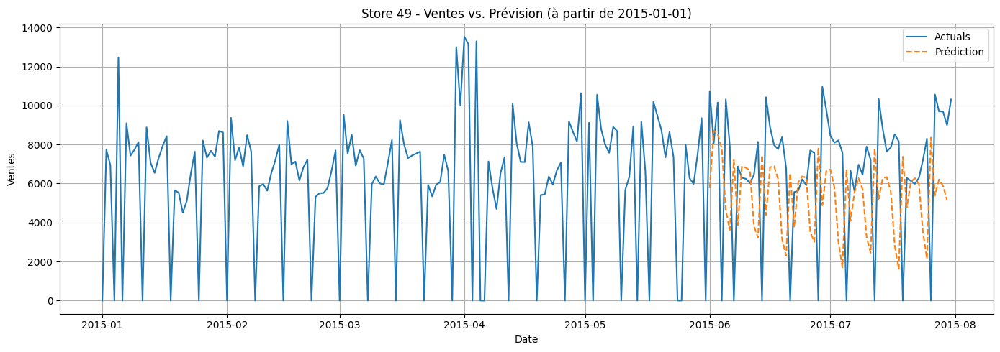

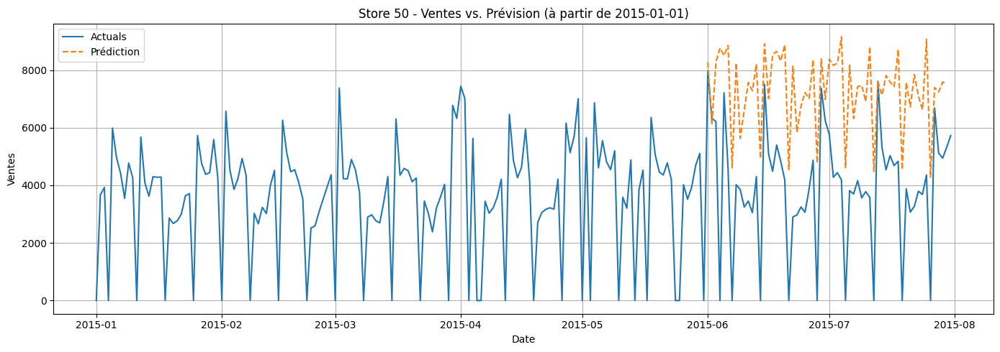

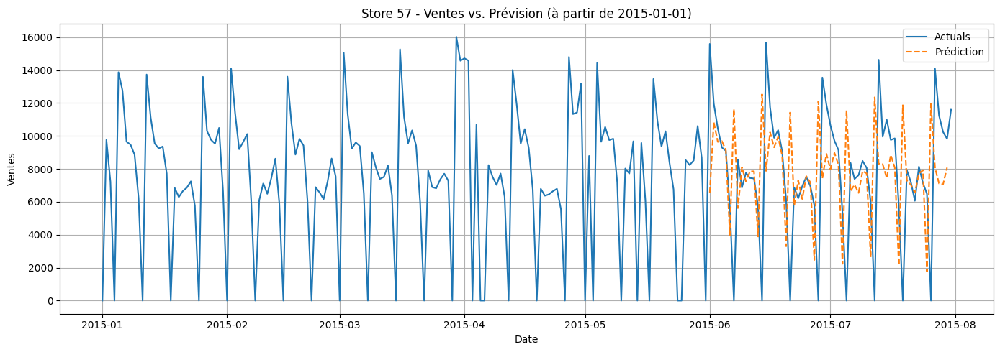

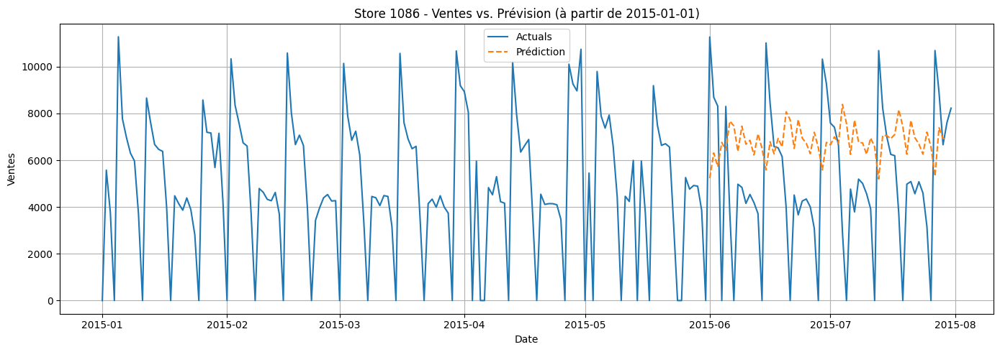

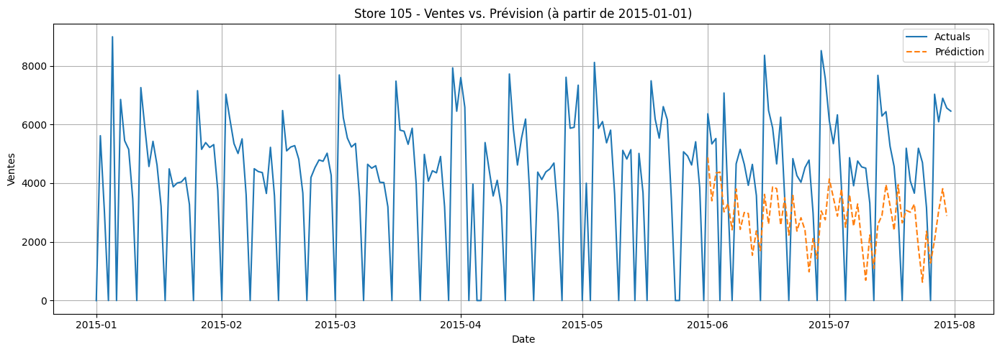

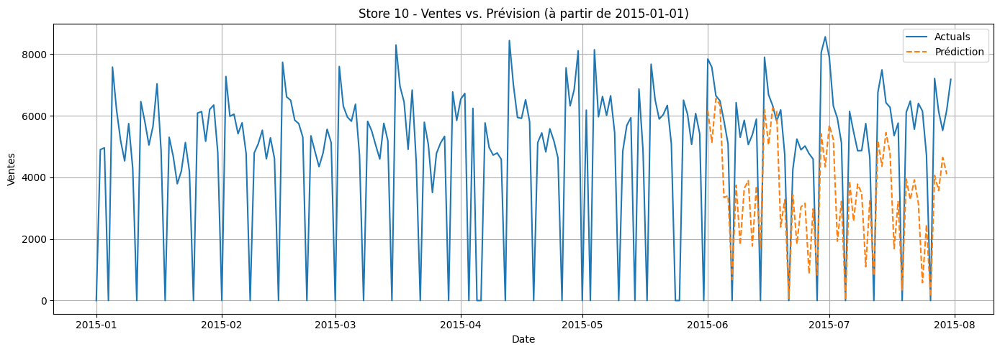

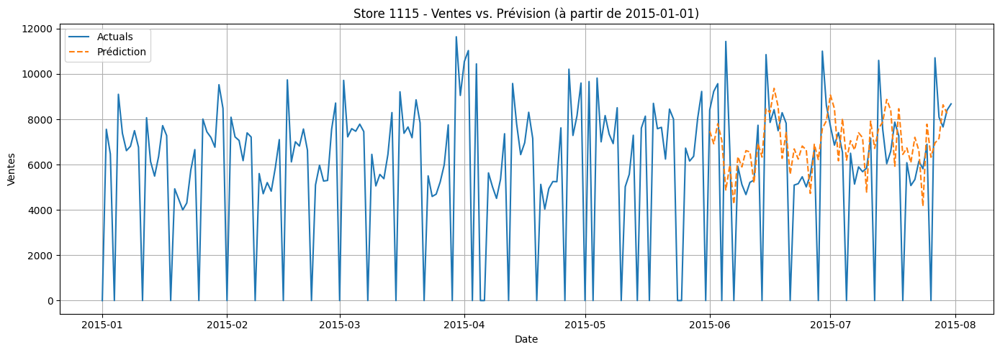

In [86]:
df_combined = pd.concat([df_train, df_test_eval])
plot_forecasts(df_combined, store_ids=selected_stores, start_date='2015-01-01', forecast_col='Sales_forecast')

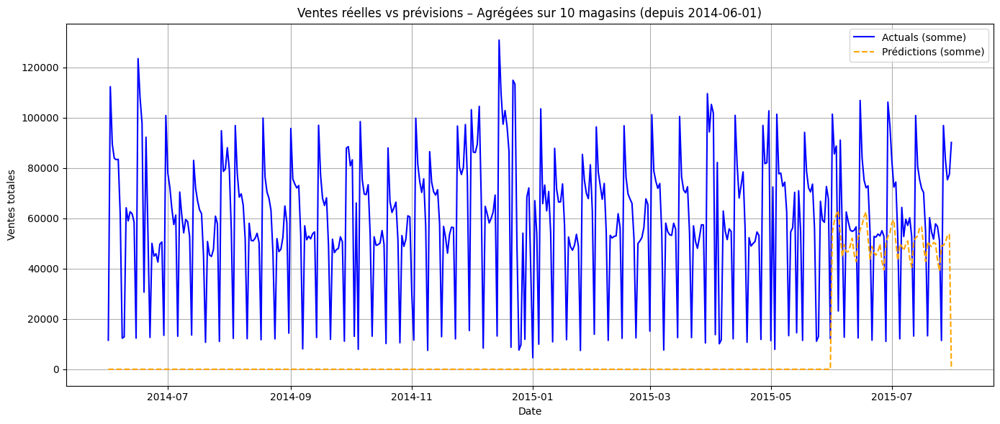

In [87]:
plot_aggregated_forecast(df_combined, store_ids=selected_stores, start_date='2014-06-01')

En plus de donner de mauvais résultats, ETSformer est relativement lent à entrainer, complexe à paramétrer et rapidement instable en fonction des paramètres rentrés. nous ne l'utiliserons donc pas d'avantage et allons passer à une approche beaucoup plus performante;